# 04-glioma-growth-localization-metrics.ipynb

Using the `glioma-growth`conda environment

Arvid Lundervold 

Last updated: 2024-11-09

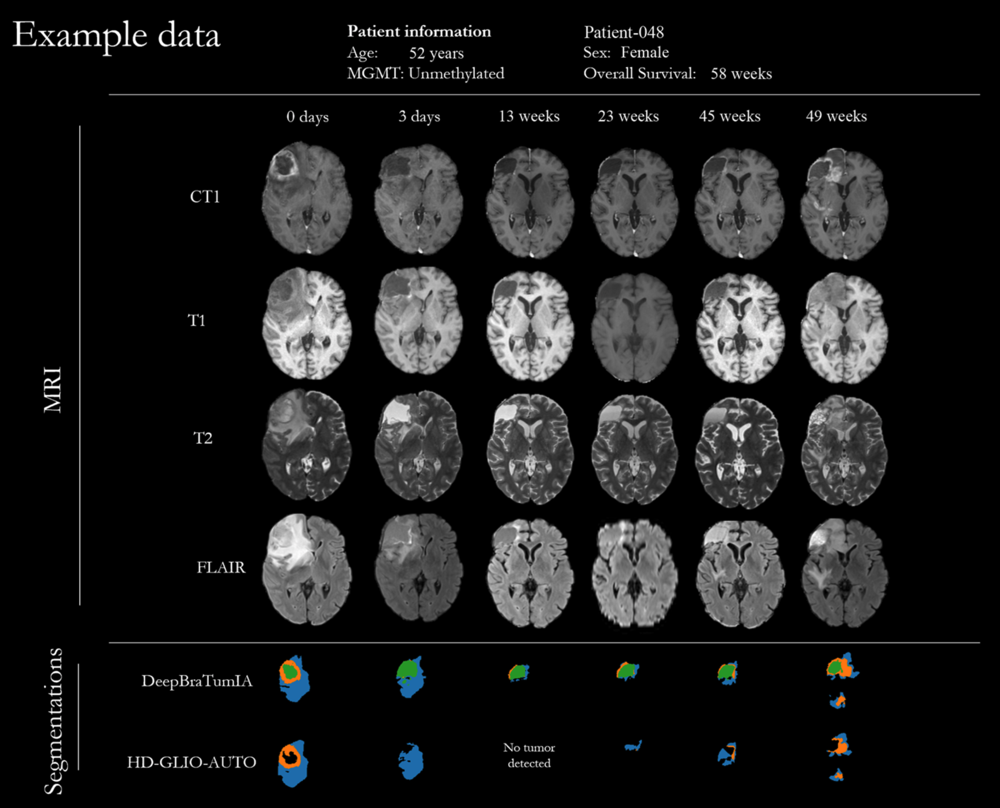

In [1]:
import os
curr_dir = f"{os.path.expanduser('~')}/GitHub/glioma-growth/notebooks"
os.chdir(curr_dir)

home = os.path.expanduser('~')

from IPython.display import Image, display
display(Image(filename='../assets/LUMIERE-Patient-048-1.png', width=800))

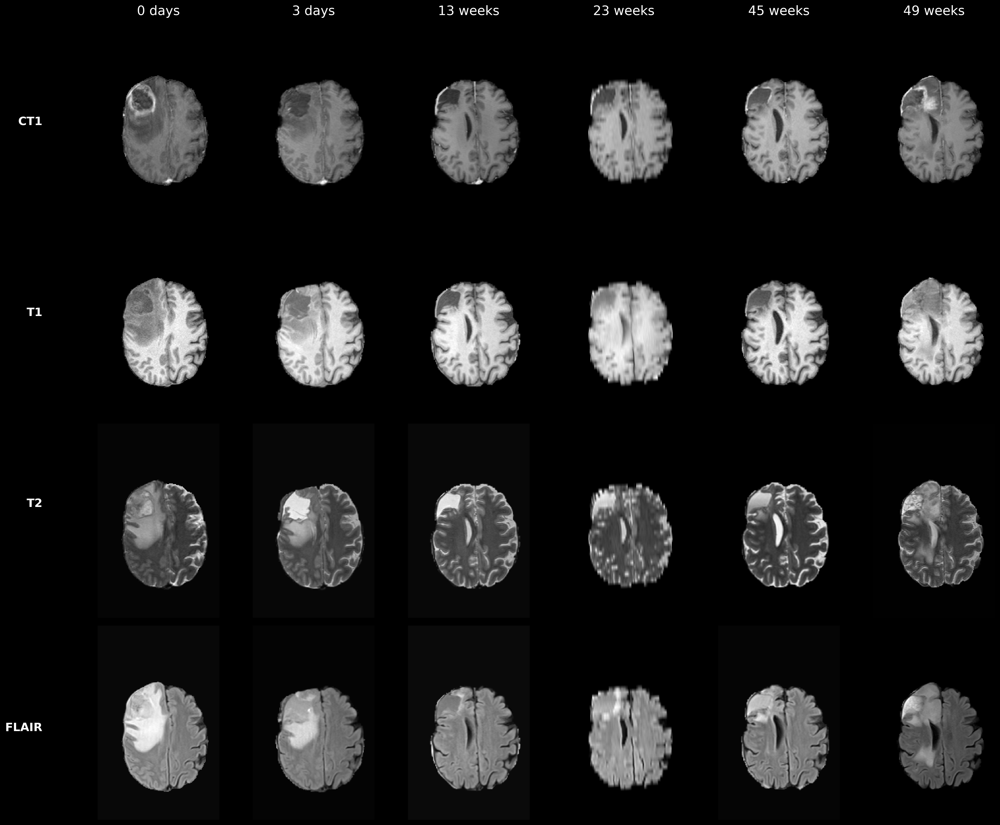

In [2]:
 display(Image(filename=f'{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/registered_timepoints/longitudinal_registration_visualization.png', width=800))

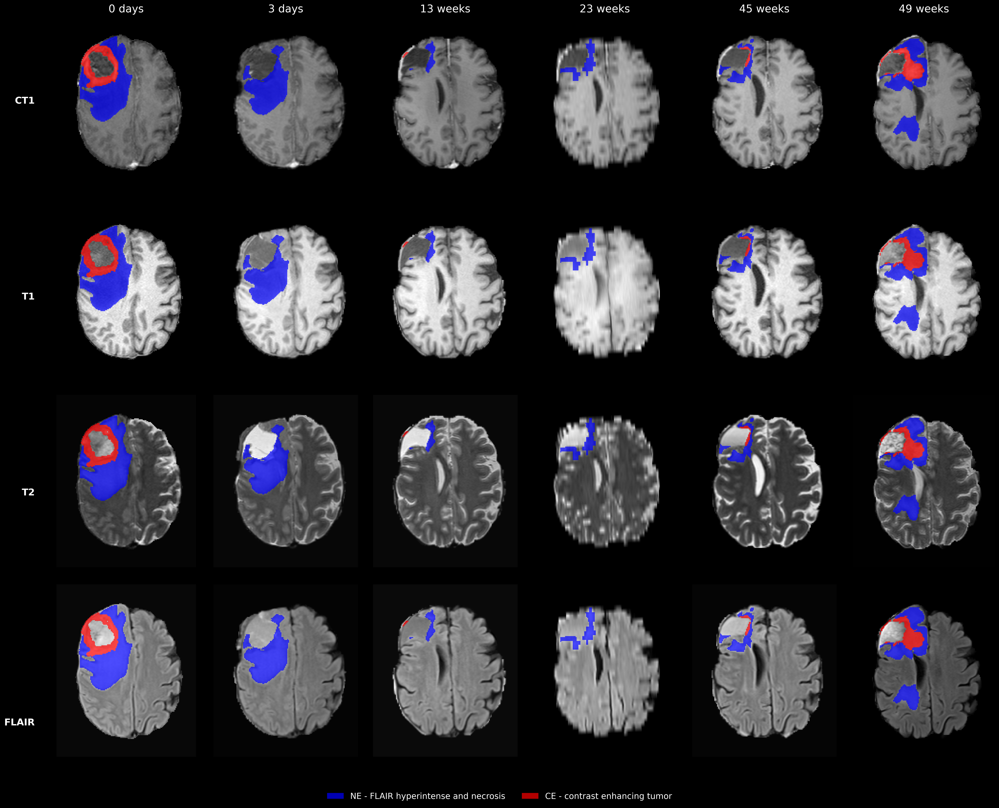

In [3]:
display(Image(filename=f'{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/registered_timepoints/longitudinal_registration_visualization_with_segmentation.png', width=800))

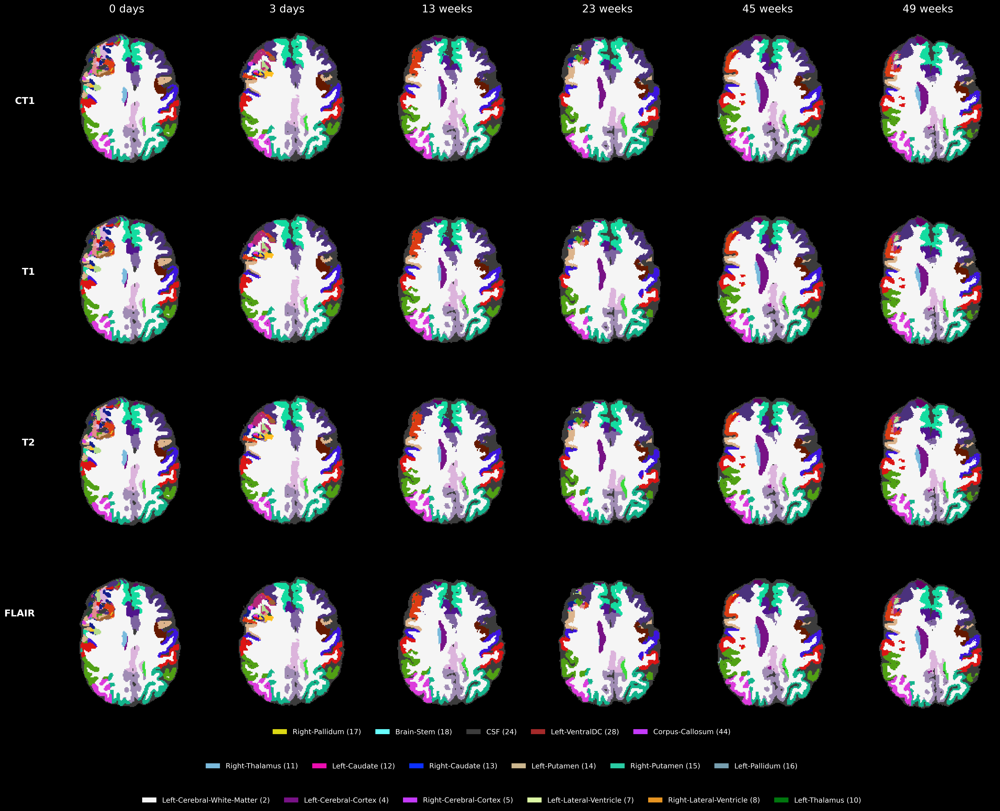

In [4]:
display(Image(filename=f'{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/registered_timepoints/longitudinal_registration_visualization_with_synthseg_all_alpha_1.png', width=800))

In [5]:
# Import libraries
import os
import sys
import pathlib
import platform
import re
import glob
import shutil
import subprocess
import warnings
from itertools import repeat
import json
import numpy as np
import pandas as pd
import ants
import nibabel as nib


In [6]:
if platform.system() == 'Darwin':
    print(f'OK, you are running on MacOS ({platform.version()})')
    TREE = '/usr/local/bin/tree -L 1'          # MacOS (brew install tree)
    fshome = '/Applications/freesurfer/7.4.1'
    MacOS = True
if platform.system() == 'Linux':
    print(f'OK, you are running on Linux ({platform.version()})')
    TREE = '/usr/bin/tree -L 4'
    fshome = '/usr/local/freesurfer/7.4.1'
    MacOS = False
if platform.system() == 'Windows':
    print(f'OK, but consider to install WSL for Windows10 since you are running on {platform.system()}')
    print('Check https://docs.microsoft.com/en-us/windows/wsl/install-win10')

OK, you are running on MacOS (Darwin Kernel Version 24.1.0: Thu Oct 10 21:02:27 PDT 2024; root:xnu-11215.41.3~2/RELEASE_X86_64)


**Copy LUMIERE Patient-048 HD-GLIO segmented and registered data to the `LUMIERE-Patient-048-reg` directory**

In [7]:
tp = ['week-000-1', 'week-000-2', 'week-013', 'week-023', 'week-045', 'week-049']
all_chns = ['T1', 'CT1', 'T2', 'FLAIR']

In [8]:
def get_subjs(exam_dir):
    all_dirs = sorted(glob.glob(f'{exam_dir}/*'))    # exams from local recordings
    subjs = [ os.path.basename(d) for d in all_dirs]
    n = len(subjs)

    print(f'{n} examinations:')
    print('[')
    for i, sub in enumerate(subjs):
      print(f"'{sub}',")
    print(']')
    return subjs


In [9]:
for t in tp:
    exam_dir = f"{os.path.expanduser('~')}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/{t}"
    print(f'exam_dir: {exam_dir}')
    subjs = get_subjs(exam_dir)

exam_dir: /Users/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/week-000-1
6 examinations:
[
'CT1.nii.gz',
'FLAIR.nii.gz',
'T1.nii.gz',
'T2.nii.gz',
'segmentation.nii.gz',
'synthseg.nii.gz',
]
exam_dir: /Users/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/week-000-2
6 examinations:
[
'CT1.nii.gz',
'FLAIR.nii.gz',
'T1.nii.gz',
'T2.nii.gz',
'segmentation.nii.gz',
'synthseg.nii.gz',
]
exam_dir: /Users/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/week-013
6 examinations:
[
'CT1.nii.gz',
'FLAIR.nii.gz',
'T1.nii.gz',
'T2.nii.gz',
'segmentation.nii.gz',
'synthseg.nii.gz',
]
exam_dir: /Users/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/week-023
6 examinations:
[
'CT1.nii.gz',
'FLAIR.nii.gz',
'T1.nii.gz',
'T2.nii.gz',
'segmentation.nii.gz',
'synthseg.nii.gz',
]
exam_dir: /Users/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/week-045
6 examinations:
[
'CT1.nii.gz',
'FLAIR.nii.gz',
'T1.nii.gz',
'T2.nii.gz',
'segmentation.nii.gz',
'synthseg.nii.gz'

## Stack of registrations by modality and segmentations


In [10]:
# The channels
chns = ['T1', 'CT1', 'T2', 'FLAIR', 'segmentation', 'synthseg']

# The timepoints
tp = ['week-000-1', 'week-000-2', 'week-013', 'week-023', 'week-045', 'week-049']


In [11]:
def merge_images_nifti(image_list, output_path, reference_affine):
    """
    Merge a list of ANTs images into a single 4D NIfTI file using nibabel
    
    Args:
        image_list: List of ANTs images to merge
        output_path: Path to save the merged 4D NIfTI file
        reference_affine: Affine matrix from reference T1 image
    """
    import nibabel as nib
    
    # Convert ANTs images to numpy arrays
    arrays = [img.numpy() for img in image_list]
    
    # Stack arrays along a new axis (time)
    merged_array = np.stack(arrays, axis=-1)
    
    # Create and save NIfTI image using reference affine
    nii_img = nib.Nifti1Image(merged_array, reference_affine)
    nib.save(nii_img, output_path)
    
    print(f"Saved 4D image to {output_path}")
    print(f"Shape: {merged_array.shape}")

# Get reference T1 affine from week-000-1
ref_t1_path = f"{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/week-000-1/T1.nii.gz"
ref_t1_nii = nib.load(ref_t1_path)
reference_affine = ref_t1_nii.affine

# Loop over the channels and timepoints and build the stacks of images
img_stack = {chn: [] for chn in chns}
for chn in chns:
    print(f'\n{chn}: ', end='')
    for t in tp:
        print(f'{t}', end=' ')
        # Add the image to its channel stack
        img_stack[chn].append(ants.image_read(
            f'{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/registered_timepoints/{t}_{chn}_registered.nii.gz'
        ))
print('\n')

# For each chn save the stack of images to a nifti file
for chn in chns:
    output_path = f'{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/registered_timepoints/stack_{chn}.nii.gz'
    merge_images_nifti(img_stack[chn], output_path, reference_affine)

# Print the common affine matrix for all stacks
print(f'reference_affine: {reference_affine}')


T1: week-000-1 week-000-2 week-013 week-023 week-045 week-049 
CT1: week-000-1 week-000-2 week-013 week-023 week-045 week-049 
T2: week-000-1 week-000-2 week-013 week-023 week-045 week-049 
FLAIR: week-000-1 week-000-2 week-013 week-023 week-045 week-049 
segmentation: week-000-1 week-000-2 week-013 week-023 week-045 week-049 
synthseg: week-000-1 week-000-2 week-013 week-023 week-045 week-049 

Saved 4D image to /Users/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/registered_timepoints/stack_T1.nii.gz
Shape: (160, 256, 256, 6)
Saved 4D image to /Users/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/registered_timepoints/stack_CT1.nii.gz
Shape: (160, 256, 256, 6)
Saved 4D image to /Users/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/registered_timepoints/stack_T2.nii.gz
Shape: (160, 256, 256, 6)
Saved 4D image to /Users/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/registered_timepoints/stack_FLAIR.nii.gz
Shape: (160, 256, 256, 6)
Saved 4D image t

In [12]:
# Make a 6x6 matrix of the best axial slice for each channel and timepoint from the 6 stacks

def create_multimodal_temporal_visualization(base_dir, channels, timepoints, slice_idx=None):
    """
    Create a 6x6 visualization with normalized intensities across timepoints.
    
    Args:
        base_dir: Base directory containing stacked images
        channels: List of channels/modalities
        timepoints: List of timepoints
        slice_idx: Specific axial slice to display (optional)
    """
    import matplotlib.pyplot as plt
    import nibabel as nib
    
    # Setup figure
    fig, axes = plt.subplots(len(channels), len(timepoints), figsize=(20, 20))
    plt.subplots_adjust(wspace=0.01, hspace=0.01)
    
    # Create colormaps for different modalities
    cmaps = {
        'T1': 'gray',
        'CT1': 'gray',
        'T2': 'gray',
        'FLAIR': 'gray',
        'segmentation': 'jet',
        'synthseg': 'viridis' # 'tab20'
    }
    
    # Load and display images
    for i, chn in enumerate(channels):
        # Load 4D stack
        stack_path = f'{base_dir}/registered_timepoints/stack_{chn}.nii.gz'
        img = nib.load(stack_path)
        data = img.get_fdata()
        
        # If slice_idx not provided, use middle slice
        if slice_idx is None:
            slice_idx = data.shape[2] // 2
            
        # For structural images, normalize intensities across timepoints
        if chn in ['T1', 'CT1', 'T2', 'FLAIR']:
            # Get all slices for this channel
            all_slices = data[:, :, slice_idx, :]
            
            # Calculate global mean and std for normalization
            global_mean = np.mean(all_slices[all_slices > np.percentile(all_slices, 5)])
            global_std = np.std(all_slices[all_slices > np.percentile(all_slices, 5)])
            
            # Set consistent display range based on global statistics
            vmin = global_mean - 2 * global_std
            vmax = global_mean + 2 * global_std
        else:
            # For segmentation images, use full range
            vmin, vmax = 0, data.max()
        
        # Display each timepoint
        for j, tp in enumerate(timepoints):
            # Get the slice for this timepoint
            slice_data = data[:, :, slice_idx, j]

            # Rotate for proper display orientation (radiological convention)
            #slice_data = np.rot90(slice_data, k=-1)
            #slice_data = np.fliplr(slice_data)
            
            # For structural images, normalize the slice
            if chn in ['T1', 'CT1', 'T2', 'FLAIR']:
                # Remove extreme outliers
                mask = slice_data > np.percentile(slice_data, 5)
                if mask.any():
                    slice_mean = np.mean(slice_data[mask])
                    slice_std = np.std(slice_data[mask])
                    # Normalize to match global statistics
                    slice_data = ((slice_data - slice_mean) / slice_std * global_std + global_mean)
            
            # Rotate for proper display orientation (radiological convention)
            slice_data = np.rot90(slice_data, k=+1)
            slice_data = np.fliplr(slice_data)
            
            # Display slice
            im = axes[i,j].imshow(slice_data, 
                                cmap=cmaps[chn],
                                vmin=vmin,
                                vmax=vmax)
            axes[i,j].axis('off')
            
            # Add labels
            if i == 0:  # Top row: timepoint labels
                axes[i,j].set_title(tp, pad=5)
            if j == 0:  # Left column: channel labels
                axes[i,j].set_ylabel(chn, rotation=90, labelpad=10)
    
    plt.tight_layout()
    
    # Save figure
    output_path = f'{base_dir}/registered_timepoints/multimodal_temporal_visualization.png'
    #plt.savefig(output_path, dpi=300, bbox_inches='tight')
    print(f"Saved visualization to {output_path}")
    
    plt.show()



Saved visualization to /Users/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/registered_timepoints/multimodal_temporal_visualization.png


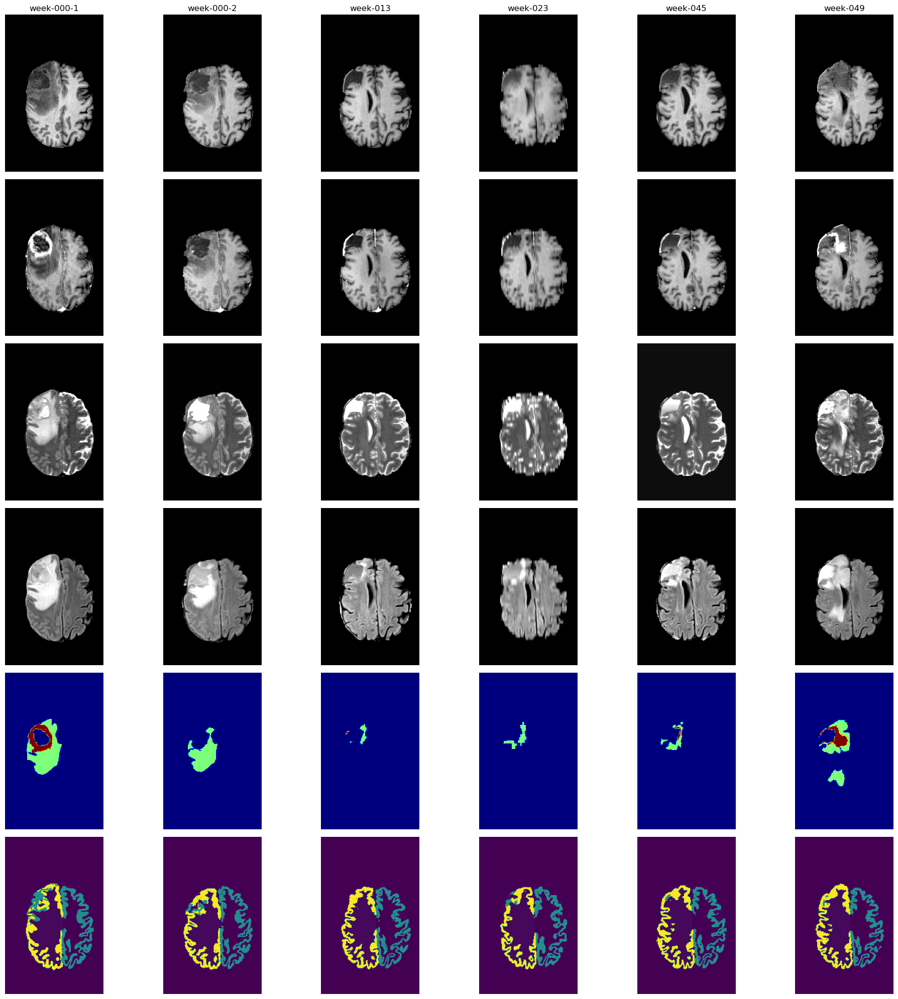

CPU times: user 5.16 s, sys: 2.59 s, total: 7.76 s
Wall time: 9.21 s


In [13]:
%%time
# Example usage:
slice_idx = 185  # or whatever slice shows the tumor best
create_multimodal_temporal_visualization(
    base_dir=f"{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg",
    channels=chns,
    timepoints=tp,
    slice_idx=slice_idx
)

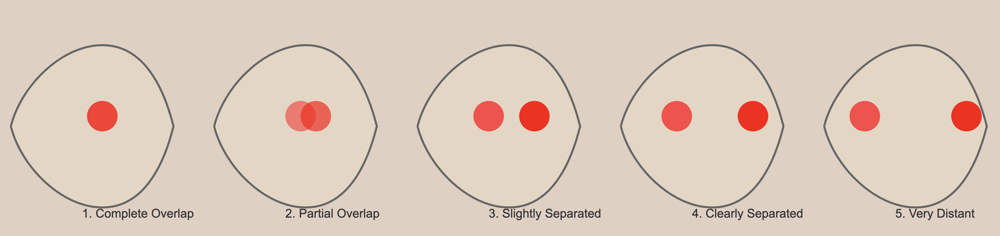

In [14]:
 display(Image(filename=f'{home}/GitHub/glioma-growth/assets/brain-tumor-progression.png', width=800))

_**cursor** (with claude-3.5-sonnet)_ 


 Each diagram shows:

1. Complete Overlap: The primary and recurrent tumors are in exactly the same location, shown by overlapping red circles
2. Partial Overlap: The tumors share some space but are slightly offset
3. Slightly Separated: A small gap exists between the two tumors
4. Clearly Separated: The tumors are distinctly separated with a notable distance
5. Very Distant: The tumors are at opposite sides of the brain region

In each diagram:
- The darker red represents the primary tumor
- The brighter red represents the recurrent tumor
- The brain outline is shown in a neutral tone for context

Would you like me to modify any aspects of these diagrams, such as:
- The color scheme
- The size of the tumors
- The spacing between positions
- Additional anatomical details<br>


We want to assess, at any point in time, the overlap (absolute mm^3 and percentage) between tumor compartments and underlying tissue classes defined by coregistered synthseg, say between week-000-1_segmentation_registered.nii.gz and week-000-1_synthseg_registered.nii.gz. 


Overlap Analysis for week-000-1:
    Timepoint        Tissue  Overlap_Volume_mm3  Tumor_Volume_mm3  Tissue_Volume_mm3  Percent_of_Tumor  Percent_of_Tissue
0  week-000-1  White Matter            66963.00         126815.00          353107.00             52.80              18.96
1  week-000-1   Gray Matter                0.00         126815.00               0.00              0.00               0.00
2  week-000-1           CSF             8201.00         126815.00          155592.00              6.47               5.27
3  week-000-1     Deep Gray             8129.00         126815.00           38422.00              6.41              21.16

Overlap Analysis for week-000-2:
    Timepoint        Tissue  Overlap_Volume_mm3  Tumor_Volume_mm3  Tissue_Volume_mm3  Percent_of_Tumor  Percent_of_Tissue
0  week-000-2  White Matter            43188.00          64883.00          354428.00             66.56              12.19
1  week-000-2   Gray Matter                0.00          64883.00             

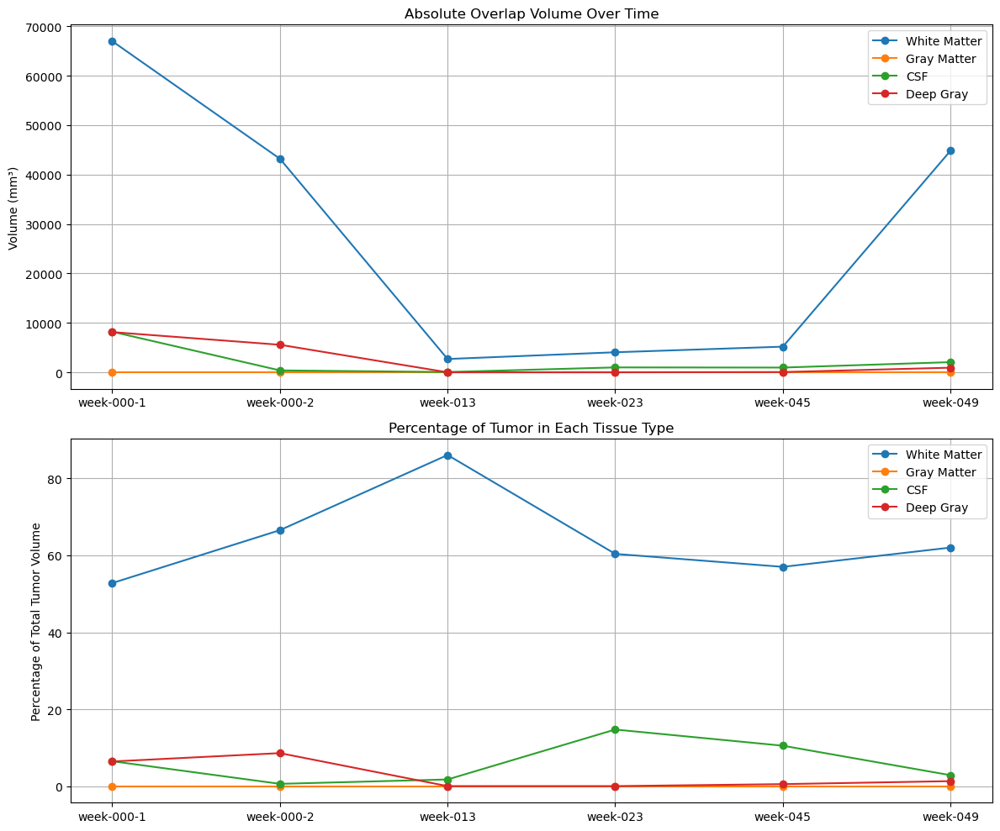

In [15]:
def analyze_tumor_tissue_overlap(base_dir, timepoint):
    """
    Analyze overlap between tumor segmentation and tissue classes from synthseg
    
    Args:
        base_dir: Base directory containing registered images
        timepoint: Timepoint to analyze (e.g., 'week-000-1')
    
    Returns:
        DataFrame with overlap statistics
    """
    import nibabel as nib
    import pandas as pd
    
    # Load segmentations
    seg_path = f"{base_dir}/registered_timepoints/{timepoint}_segmentation_registered.nii.gz"
    synth_path = f"{base_dir}/registered_timepoints/{timepoint}_synthseg_registered.nii.gz"
    
    seg_img = nib.load(seg_path)
    synth_img = nib.load(synth_path)
    
    # Get voxel dimensions for volume calculation
    voxel_volume = np.prod(seg_img.header.get_zooms())  # mm³
    
    # Get data
    tumor_mask = seg_img.get_fdata() > 0  # Binary tumor mask
    tissue_labels = synth_img.get_fdata()
    
    # Define key tissue classes (based on FreeSurfer labels)
    tissue_classes = {
        'White Matter': [2, 41],  # Left and Right Cerebral White Matter
        'Gray Matter': [3, 42],   # Left and Right Cerebral Cortex
        'CSF': [4, 5, 14, 15, 24],  # Ventricles and CSF
        'Deep Gray': [9, 10, 11, 12, 13, 17, 18, 48, 49, 50, 51, 52, 53, 54]  # Thalamus, Caudate, etc.
    }
    
    # Initialize results dictionary
    results = []
    
    # Calculate overlaps for each tissue class
    for tissue_name, labels in tissue_classes.items():
        # Create mask for this tissue class
        tissue_mask = np.isin(tissue_labels, labels)
        
        # Calculate overlap
        overlap = np.logical_and(tumor_mask, tissue_mask)
        
        # Calculate volumes
        tumor_volume = np.sum(tumor_mask) * voxel_volume
        tissue_volume = np.sum(tissue_mask) * voxel_volume
        overlap_volume = np.sum(overlap) * voxel_volume
        
        # Calculate percentages
        percent_of_tumor = (overlap_volume / tumor_volume) * 100 if tumor_volume > 0 else 0
        percent_of_tissue = (overlap_volume / tissue_volume) * 100 if tissue_volume > 0 else 0
        
        results.append({
            'Timepoint': timepoint,
            'Tissue': tissue_name,
            'Overlap_Volume_mm3': overlap_volume,
            'Tumor_Volume_mm3': tumor_volume,
            'Tissue_Volume_mm3': tissue_volume,
            'Percent_of_Tumor': percent_of_tumor,
            'Percent_of_Tissue': percent_of_tissue
        })
    
    # Convert to DataFrame
    df = pd.DataFrame(results)
    
    # Print summary
    print(f"\nOverlap Analysis for {timepoint}:")
    print(df.to_string(float_format=lambda x: '{:.2f}'.format(x)))
    
    return df

# Analyze all timepoints
all_results = []
for tp in tp:  # tp is your list of timepoints
    df = analyze_tumor_tissue_overlap(
        base_dir=f"{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg",
        timepoint=tp
    )
    all_results.append(df)

# Combine results
combined_results = pd.concat(all_results, ignore_index=True)

# Create visualization of results
def plot_overlap_evolution(combined_results):
    """Plot the evolution of tumor-tissue overlap over time"""
    import matplotlib.pyplot as plt
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))
    
    # Plot absolute volumes
    for tissue in combined_results['Tissue'].unique():
        tissue_data = combined_results[combined_results['Tissue'] == tissue]
        ax1.plot(tissue_data['Timepoint'], tissue_data['Overlap_Volume_mm3'], 
                marker='o', label=tissue)
    
    ax1.set_title('Absolute Overlap Volume Over Time')
    ax1.set_ylabel('Volume (mm³)')
    ax1.legend()
    ax1.grid(True)
    
    # Plot percentages
    for tissue in combined_results['Tissue'].unique():
        tissue_data = combined_results[combined_results['Tissue'] == tissue]
        ax2.plot(tissue_data['Timepoint'], tissue_data['Percent_of_Tumor'], 
                marker='o', label=tissue)
    
    ax2.set_title('Percentage of Tumor in Each Tissue Type')
    ax2.set_ylabel('Percentage of Total Tumor Volume')
    ax2.legend()
    ax2.grid(True)
    
    plt.tight_layout()
    plt.show()

# Plot results
plot_overlap_evolution(combined_results)

_Make a separation of Enhancing and Non-enhancing part of the tumor, along with the underlying tissue classes. Aloso make a distinction between left hemisphere and right hemisphere._


Processing timepoint: week-000-1
Loading files:
/Users/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/registered_timepoints/week-000-1_segmentation_registered.nii.gz
/Users/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/registered_timepoints/week-000-1_synthseg_registered.nii.gz

Image dimensions:
Segmentation: (160, 256, 256)
Synthseg: (160, 256, 256)

Detailed Overlap Analysis for week-000-1:
     Timepoint Tumor_Compartment              Tissue Hemisphere  Overlap_Volume_mm3  Tumor_Volume_mm3  Tissue_Volume_mm3  Percent_of_Tumor  Percent_of_Tissue
0   week-000-1         Enhancing   Left White Matter       Left                0.00          25904.00          167067.00              0.00               0.00
1   week-000-1         Enhancing  Right White Matter      Right            10409.00          25904.00          186040.00             40.18               5.60
2   week-000-1         Enhancing    Left Gray Matter       Left                0.00          25904.00        

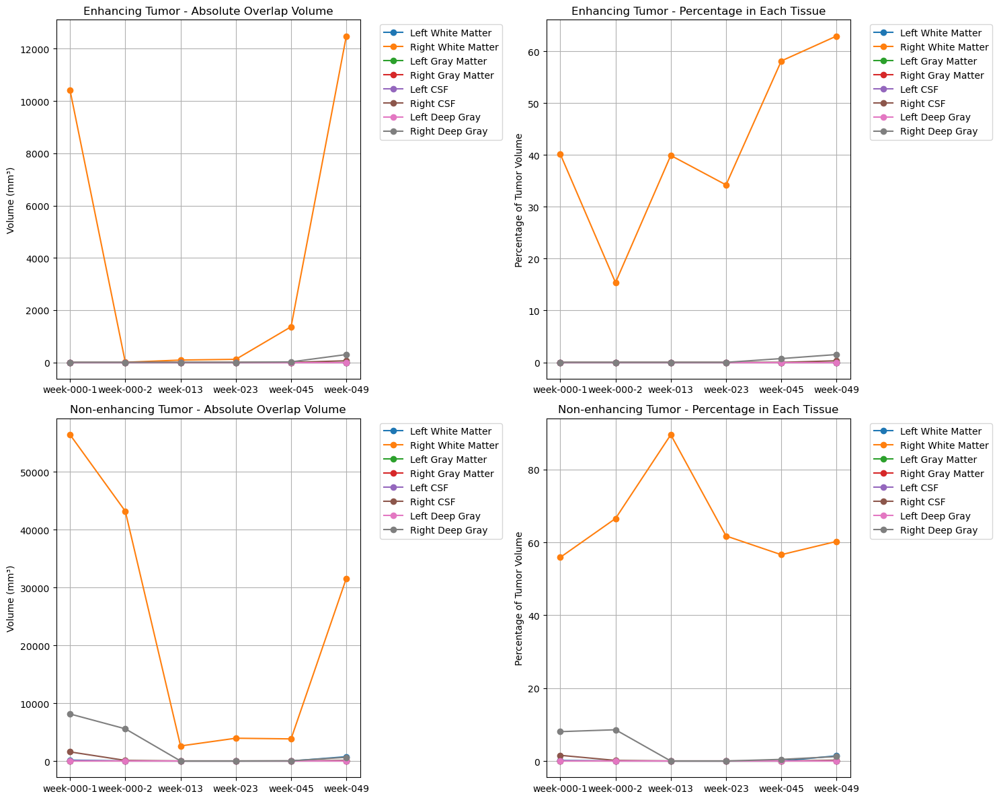

In [16]:
def analyze_detailed_tumor_tissue_overlap(base_dir, timepoint):
    """
    Analyze overlap between tumor compartments (enhancing/non-enhancing) and 
    tissue classes from synthseg, separated by hemisphere
    
    Args:
        base_dir: Base directory containing registered images
        timepoint: Timepoint to analyze
    """
    import nibabel as nib
    import pandas as pd
    
    # Load segmentations
    seg_path = f"{base_dir}/registered_timepoints/{timepoint}_segmentation_registered.nii.gz"
    synth_path = f"{base_dir}/registered_timepoints/{timepoint}_synthseg_registered.nii.gz"
    
    print(f"Loading files:\n{seg_path}\n{synth_path}")
    
    try:
        seg_img = nib.load(seg_path)
        synth_img = nib.load(synth_path)
        
        # Print image dimensions for debugging
        print(f"\nImage dimensions:")
        print(f"Segmentation: {seg_img.shape}")
        print(f"Synthseg: {synth_img.shape}")
        
        if seg_img.shape != synth_img.shape:
            print("\nWarning: Images have different dimensions!")
            print("This suggests they might not be properly coregistered.")
            return None
            
    except FileNotFoundError as e:
        print(f"Error: {e}")
        import glob
        print("\nAvailable files in directory:")
        print(glob.glob(f"{base_dir}/registered_timepoints/*"))
        return None
    
    # Get voxel dimensions for volume calculation
    voxel_volume = np.prod(seg_img.header.get_zooms())  # mm³
    
    # Get data
    tumor_data = seg_img.get_fdata()
    tissue_labels = synth_img.get_fdata()
    
    # Define tumor compartments (adjust values based on your segmentation labels)
    tumor_compartments = {
        'Enhancing': tumor_data == 2,  # Adjust value for enhancing tumor
        'Non-enhancing': tumor_data == 1  # Adjust value for non-enhancing tumor
    }
    
    # Define tissue classes by hemisphere
    tissue_classes = {
        'Left White Matter': [2],      # Left Cerebral White Matter
        'Right White Matter': [41],     # Right Cerebral White Matter
        'Left Gray Matter': [3],       # Left Cerebral Cortex
        'Right Gray Matter': [42],      # Right Cerebral Cortex
        'Left CSF': [4, 5, 14],        # Left Ventricles
        'Right CSF': [43, 44, 15],      # Right Ventricles
        'Left Deep Gray': [10, 11, 12, 13, 17, 18],  # Left deep structures
        'Right Deep Gray': [49, 50, 51, 52, 53, 54]  # Right deep structures
    }
    
    # Initialize results
    results = []
    
    # Calculate overlaps for each tumor compartment and tissue class
    for comp_name, comp_mask in tumor_compartments.items():
        comp_volume = np.sum(comp_mask) * voxel_volume
        
        for tissue_name, labels in tissue_classes.items():
            # Create mask for this tissue class
            tissue_mask = np.isin(tissue_labels, labels)
            
            # Calculate overlap
            overlap = np.logical_and(comp_mask, tissue_mask)
            
            # Calculate volumes
            tissue_volume = np.sum(tissue_mask) * voxel_volume
            overlap_volume = np.sum(overlap) * voxel_volume
            
            # Calculate percentages
            percent_of_tumor = (overlap_volume / comp_volume) * 100 if comp_volume > 0 else 0
            percent_of_tissue = (overlap_volume / tissue_volume) * 100 if tissue_volume > 0 else 0
            
            results.append({
                'Timepoint': timepoint,
                'Tumor_Compartment': comp_name,
                'Tissue': tissue_name,
                'Hemisphere': 'Left' if 'Left' in tissue_name else 'Right',
                'Overlap_Volume_mm3': overlap_volume,
                'Tumor_Volume_mm3': comp_volume,
                'Tissue_Volume_mm3': tissue_volume,
                'Percent_of_Tumor': percent_of_tumor,
                'Percent_of_Tissue': percent_of_tissue
            })
    
    # Convert to DataFrame
    df = pd.DataFrame(results)
    
    # Print summary
    print(f"\nDetailed Overlap Analysis for {timepoint}:")
    print(df.to_string(float_format=lambda x: '{:.2f}'.format(x)))
    
    return df

def plot_detailed_overlap_evolution(combined_results):
    """Plot the evolution of tumor-tissue overlap over time with enhanced detail"""
    import matplotlib.pyplot as plt
    
    # Create subplots for each tumor compartment
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    
    compartments = ['Enhancing', 'Non-enhancing']
    hemispheres = ['Left', 'Right']
    
    for i, comp in enumerate(compartments):
        comp_data = combined_results[combined_results['Tumor_Compartment'] == comp]
        
        # Plot absolute volumes
        ax = axes[i, 0]
        for tissue in comp_data['Tissue'].unique():
            tissue_data = comp_data[comp_data['Tissue'] == tissue]
            ax.plot(tissue_data['Timepoint'], tissue_data['Overlap_Volume_mm3'], 
                   marker='o', label=tissue)
        
        ax.set_title(f'{comp} Tumor - Absolute Overlap Volume')
        ax.set_ylabel('Volume (mm³)')
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        ax.grid(True)
        
        # Plot percentages
        ax = axes[i, 1]
        for tissue in comp_data['Tissue'].unique():
            tissue_data = comp_data[comp_data['Tissue'] == tissue]
            ax.plot(tissue_data['Timepoint'], tissue_data['Percent_of_Tumor'], 
                   marker='o', label=tissue)
        
        ax.set_title(f'{comp} Tumor - Percentage in Each Tissue')
        ax.set_ylabel('Percentage of Tumor Volume')
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        ax.grid(True)
    
    plt.tight_layout()
    plt.show()

# Define timepoints
tp = ['week-000-1', 'week-000-2', 'week-013', 'week-023', 'week-045', 'week-049']

# Analyze all timepoints
all_results = []
for timepoint in tp:
    print(f"\nProcessing timepoint: {timepoint}")
    df = analyze_detailed_tumor_tissue_overlap(
        base_dir=f"{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg",
        timepoint=timepoint
    )
    if df is not None:
        all_results.append(df)

if all_results:
    # Combine results
    combined_results = pd.concat(all_results, ignore_index=True)
    
    # Plot results
    plot_detailed_overlap_evolution(combined_results)
else:
    print("No results to plot due to file access errors")

_Make the same analysis, but for the original, unregistered data._


Processing timepoint: week-000-1
Loading files:
/Users/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/week-000-1/segmentation.nii.gz
/Users/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/week-000-1/synthseg.nii.gz

Image dimensions:
Segmentation: (160, 256, 256)
Synthseg: (160, 256, 256)

Detailed Overlap Analysis for week-000-1:
     Timepoint Tumor_Compartment              Tissue Hemisphere  Overlap_Volume_mm3  Tumor_Volume_mm3  Tissue_Volume_mm3  Percent_of_Tumor  Percent_of_Tissue
0   week-000-1         Enhancing   Left White Matter       Left                0.00          25904.00          167067.00              0.00               0.00
1   week-000-1         Enhancing  Right White Matter      Right            10409.00          25904.00          186040.00             40.18               5.60
2   week-000-1         Enhancing    Left Gray Matter       Left                0.00          25904.00               0.00              0.00               0.00
3   week-000-1   

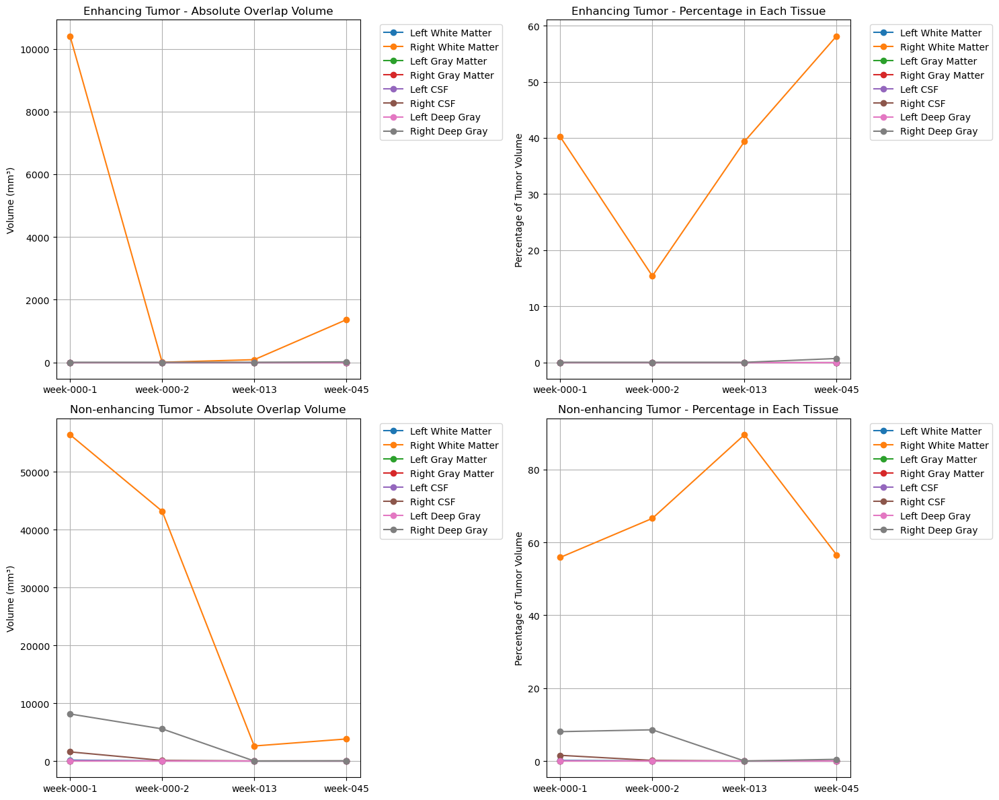

In [17]:
def analyze_detailed_tumor_tissue_overlap(base_dir, timepoint):
    """
    Analyze overlap between tumor compartments (enhancing/non-enhancing) and 
    tissue classes from synthseg, separated by hemisphere
    
    Args:
        base_dir: Base directory containing registered images
        timepoint: Timepoint to analyze
    """
    import nibabel as nib
    import pandas as pd
    
    # Load segmentations (using original paths)
    seg_path = f"{base_dir}/{timepoint}/segmentation.nii.gz"
    synth_path = f"{base_dir}/{timepoint}/synthseg.nii.gz"
    
    print(f"Loading files:\n{seg_path}\n{synth_path}")
    
    try:
        seg_img = nib.load(seg_path)
        synth_img = nib.load(synth_path)
        
        # Print image dimensions for debugging
        print(f"\nImage dimensions:")
        print(f"Segmentation: {seg_img.shape}")
        print(f"Synthseg: {synth_img.shape}")
        
        if seg_img.shape != synth_img.shape:
            print("\nWarning: Images have different dimensions!")
            print("This suggests they might not be properly coregistered.")
            return None
            
    except FileNotFoundError as e:
        print(f"Error: {e}")
        import glob
        print("\nAvailable files in directory:")
        print(glob.glob(f"{base_dir}/{timepoint}/*"))
        return None
    
    # Get voxel dimensions for volume calculation
    voxel_volume = np.prod(seg_img.header.get_zooms())  # mm³
    
    # Get data
    tumor_data = seg_img.get_fdata()
    tissue_labels = synth_img.get_fdata()
    
    # Define tumor compartments (adjust values based on your segmentation labels)
    tumor_compartments = {
        'Enhancing': tumor_data == 2,  # Adjust value for enhancing tumor
        'Non-enhancing': tumor_data == 1  # Adjust value for non-enhancing tumor
    }
    
    # Define tissue classes by hemisphere
    tissue_classes = {
        'Left White Matter': [2],      # Left Cerebral White Matter
        'Right White Matter': [41],     # Right Cerebral White Matter
        'Left Gray Matter': [3],       # Left Cerebral Cortex
        'Right Gray Matter': [42],      # Right Cerebral Cortex
        'Left CSF': [4, 5, 14],        # Left Ventricles
        'Right CSF': [43, 44, 15],      # Right Ventricles
        'Left Deep Gray': [10, 11, 12, 13, 17, 18],  # Left deep structures
        'Right Deep Gray': [49, 50, 51, 52, 53, 54]  # Right deep structures
    }
    
    # Initialize results
    results = []
    
    # Calculate overlaps for each tumor compartment and tissue class
    for comp_name, comp_mask in tumor_compartments.items():
        comp_volume = np.sum(comp_mask) * voxel_volume
        
        for tissue_name, labels in tissue_classes.items():
            # Create mask for this tissue class
            tissue_mask = np.isin(tissue_labels, labels)
            
            # Calculate overlap
            overlap = np.logical_and(comp_mask, tissue_mask)
            
            # Calculate volumes
            tissue_volume = np.sum(tissue_mask) * voxel_volume
            overlap_volume = np.sum(overlap) * voxel_volume
            
            # Calculate percentages
            percent_of_tumor = (overlap_volume / comp_volume) * 100 if comp_volume > 0 else 0
            percent_of_tissue = (overlap_volume / tissue_volume) * 100 if tissue_volume > 0 else 0
            
            results.append({
                'Timepoint': timepoint,
                'Tumor_Compartment': comp_name,
                'Tissue': tissue_name,
                'Hemisphere': 'Left' if 'Left' in tissue_name else 'Right',
                'Overlap_Volume_mm3': overlap_volume,
                'Tumor_Volume_mm3': comp_volume,
                'Tissue_Volume_mm3': tissue_volume,
                'Percent_of_Tumor': percent_of_tumor,
                'Percent_of_Tissue': percent_of_tissue
            })
    
    # Convert to DataFrame
    df = pd.DataFrame(results)
    
    # Print summary
    print(f"\nDetailed Overlap Analysis for {timepoint}:")
    print(df.to_string(float_format=lambda x: '{:.2f}'.format(x)))
    
    return df

def plot_detailed_overlap_evolution(combined_results):
    """Plot the evolution of tumor-tissue overlap over time with enhanced detail"""
    import matplotlib.pyplot as plt
    
    # Create subplots for each tumor compartment
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    
    compartments = ['Enhancing', 'Non-enhancing']
    hemispheres = ['Left', 'Right']
    
    for i, comp in enumerate(compartments):
        comp_data = combined_results[combined_results['Tumor_Compartment'] == comp]
        
        # Plot absolute volumes
        ax = axes[i, 0]
        for tissue in comp_data['Tissue'].unique():
            tissue_data = comp_data[comp_data['Tissue'] == tissue]
            ax.plot(tissue_data['Timepoint'], tissue_data['Overlap_Volume_mm3'], 
                   marker='o', label=tissue)
        
        ax.set_title(f'{comp} Tumor - Absolute Overlap Volume')
        ax.set_ylabel('Volume (mm³)')
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        ax.grid(True)
        
        # Plot percentages
        ax = axes[i, 1]
        for tissue in comp_data['Tissue'].unique():
            tissue_data = comp_data[comp_data['Tissue'] == tissue]
            ax.plot(tissue_data['Timepoint'], tissue_data['Percent_of_Tumor'], 
                   marker='o', label=tissue)
        
        ax.set_title(f'{comp} Tumor - Percentage in Each Tissue')
        ax.set_ylabel('Percentage of Tumor Volume')
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        ax.grid(True)
    
    plt.tight_layout()
    plt.show()

# Define timepoints
tp = ['week-000-1', 'week-000-2', 'week-013', 'week-023', 'week-045', 'week-049']

# Analyze all timepoints
all_results = []
for timepoint in tp:
    print(f"\nProcessing timepoint: {timepoint}")
    df = analyze_detailed_tumor_tissue_overlap(
        base_dir=f"{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg",
        timepoint=timepoint
    )
    if df is not None:
        all_results.append(df)

if all_results:
    # Combine results
    combined_results = pd.concat(all_results, ignore_index=True)
    
    # Plot results
    plot_detailed_overlap_evolution(combined_results)
else:
    print("No results to plot due to file access errors")

_Make the same analysis for registered data, but extend the analysis to all regions being segmented by SynthSeg and that occur in the right hemisphere only._


In [18]:
def inspect_synthseg_values(base_dir, timepoints, slice_idx=185):
    """
    Inspect unique values in synthseg masks across timepoints.
    Print values and their frequencies in the specified slice.
    """
    import nibabel as nib
    from pathlib import Path
    import numpy as np
    
    reg_dir = Path(base_dir) / 'registered_timepoints'
    all_values = set()
    
    # Check each timepoint
    for tp in timepoints:
        synthseg_path = reg_dir / f'{tp}_synthseg_registered.nii.gz'
        try:
            print(f"\nTimepoint {tp}:")
            
            # Load and convert to integers
            synthseg = nib.load(str(synthseg_path))
            seg_data = np.round(synthseg.get_fdata()).astype(int)
            
            # Get slice
            seg_slice = seg_data[:, :, slice_idx]
            
            # Get unique values and their counts in this slice
            unique, counts = np.unique(seg_slice, return_counts=True)
            value_counts = dict(zip(unique, counts))
            
            print("Label values and voxel counts in slice:")
            for val, count in value_counts.items():
                print(f"  Label {val:3d}: {count:6d} voxels")
            
            all_values.update(unique)
            
        except FileNotFoundError:
            print(f"Warning: File not found: {synthseg_path}")
    
    print("\nAll unique label values across timepoints:", sorted(all_values))
    return sorted(all_values)

# Run the diagnostic

# Define paths and variables
base_dir = f"{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg"
timepoints = ['week-000-1', 'week-000-2', 'week-013', 'week-023', 'week-045', 'week-049']

# Run the diagnostic function
unique_values = inspect_synthseg_values(base_dir, timepoints)


Timepoint week-000-1:
Label values and voxel counts in slice:
  Label   0:  28032 voxels
  Label   2:   2420 voxels
  Label  24:   1410 voxels
  Label  41:   3706 voxels
  Label  43:     23 voxels
  Label  50:     79 voxels
  Label 1002:     92 voxels
  Label 1003:    154 voxels
  Label 1006:     38 voxels
  Label 1007:    102 voxels
  Label 1008:     20 voxels
  Label 1009:     20 voxels
  Label 1010:      6 voxels
  Label 1011:     80 voxels
  Label 1012:     52 voxels
  Label 1013:     87 voxels
  Label 1015:     78 voxels
  Label 1016:      1 voxels
  Label 1017:     46 voxels
  Label 1018:    107 voxels
  Label 1021:      1 voxels
  Label 1022:    208 voxels
  Label 1023:    290 voxels
  Label 1024:    218 voxels
  Label 1025:    217 voxels
  Label 1026:     47 voxels
  Label 1027:    420 voxels
  Label 1028:    262 voxels
  Label 1029:    421 voxels
  Label 1031:    148 voxels
  Label 1032:     19 voxels
  Label 1033:     12 voxels
  Label 2002:     50 voxels
  Label 2008:    25


Processing week-000-1

Processing week-000-2

Processing week-013

Processing week-023

Processing week-045

Processing week-049


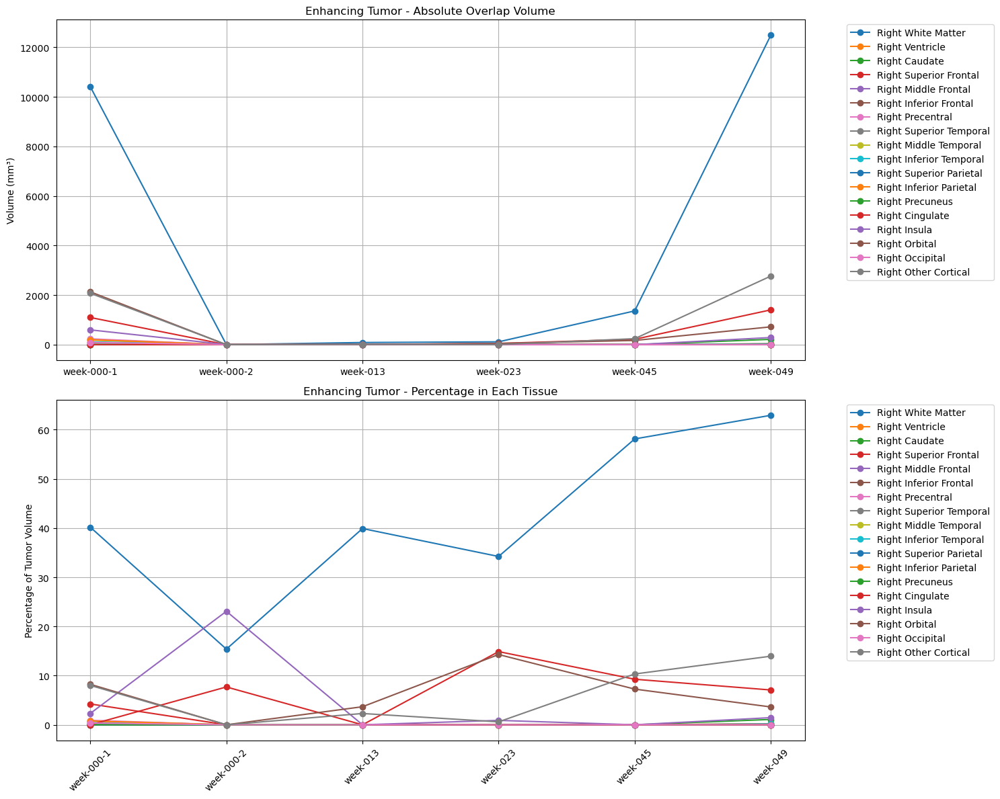

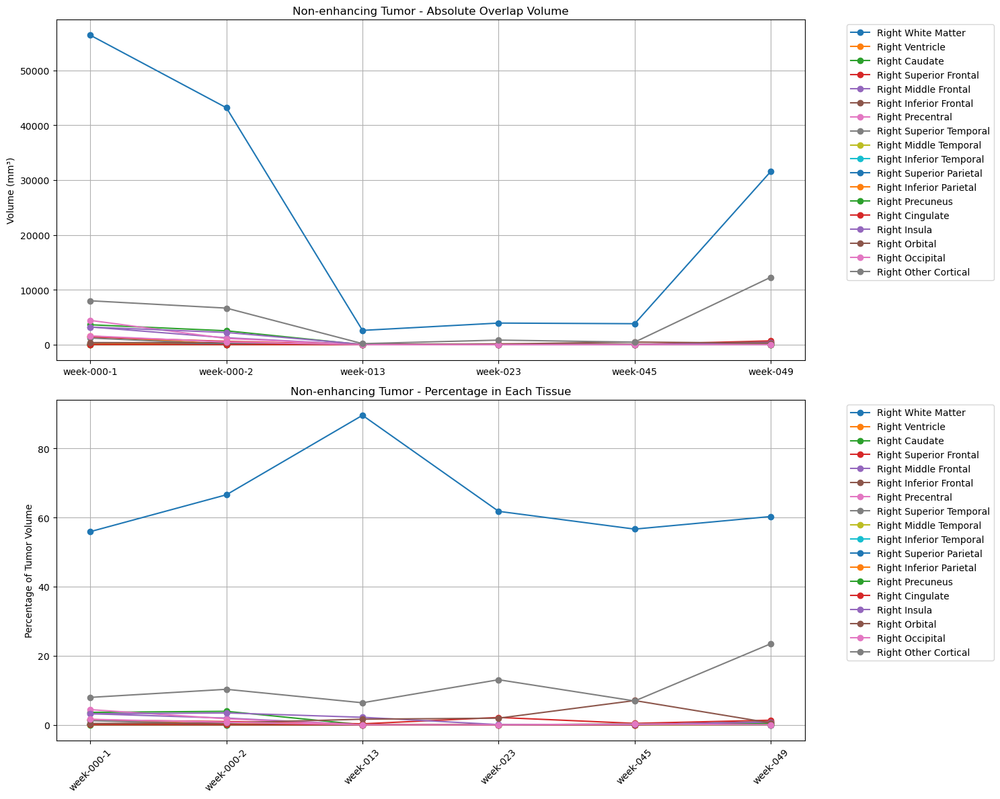


Summary of tumor distribution across right hemisphere regions:
Timepoint   Tumor_Compartment  Tissue                 
week-000-1  Enhancing          Right Caudate               0.000000
                               Right Cingulate             0.003860
                               Right Inferior Frontal      0.011581
                               Right Inferior Parietal     0.772082
                               Right Inferior Temporal     0.436226
                               Right Insula                2.304663
                               Right Middle Frontal        0.783663
                               Right Middle Temporal       0.714175
                               Right Occipital             0.355158
                               Right Orbital               8.234250
                               Right Other Cortical        8.006485
                               Right Precentral            0.911056
                               Right Precuneus             0.0154

In [19]:
def analyze_detailed_tumor_tissue_overlap(base_dir, timepoint):
    """
    Analyze overlap between tumor compartments and all right hemisphere regions from SynthSeg
    """
    import nibabel as nib
    import pandas as pd
    
    # Define comprehensive right hemisphere tissue classes
    right_tissue_classes = {
        # Subcortical structures
        'Right White Matter': [41],     # Right Cerebral White Matter
        'Right Ventricle': [43],        # Right Lateral Ventricle
        'Right Caudate': [50],          # Right Caudate
        
        # Cortical regions (2xxx series)
        'Right Superior Frontal': [2012],
        'Right Middle Frontal': [2003],
        'Right Inferior Frontal': [2017],
        'Right Precentral': [2024],
        'Right Superior Temporal': [2030],
        'Right Middle Temporal': [2015],
        'Right Inferior Temporal': [2009],
        'Right Superior Parietal': [2029],
        'Right Inferior Parietal': [2008],
        'Right Precuneus': [2025],
        'Right Cingulate': [2002],
        'Right Insula': [2035],
        'Right Orbital': [2019, 2020],
        'Right Occipital': [2022, 2023],
        
        # Additional regions present in your data
        'Right Other Cortical': [2007, 2010, 2011, 2013, 2018, 2026, 2027, 2028, 
                                2031, 2032, 2033, 2034]
    }
    
    # Load images
    seg_path = f"{base_dir}/registered_timepoints/{timepoint}_segmentation_registered.nii.gz"
    synth_path = f"{base_dir}/registered_timepoints/{timepoint}_synthseg_registered.nii.gz"
    
    try:
        seg_img = nib.load(seg_path)
        synth_img = nib.load(synth_path)
        
        if seg_img.shape != synth_img.shape:
            print(f"\nWarning: Image shape mismatch!")
            print(f"Segmentation: {seg_img.shape}")
            print(f"SynthSeg: {synth_img.shape}")
            return None
            
    except FileNotFoundError as e:
        print(f"Error: {e}")
        return None
    
    # Get voxel dimensions for volume calculation
    voxel_volume = np.prod(seg_img.header.get_zooms())  # mm³
    
    # Get data
    tumor_data = seg_img.get_fdata()
    tissue_labels = synth_img.get_fdata()
    
    # Define tumor compartments
    tumor_compartments = {
        'Enhancing': tumor_data == 2,
        'Non-enhancing': tumor_data == 1
    }
    
    # Initialize results
    results = []
    
    # Calculate overlaps
    for comp_name, comp_mask in tumor_compartments.items():
        comp_volume = np.sum(comp_mask) * voxel_volume
        
        for tissue_name, labels in right_tissue_classes.items():
            tissue_mask = np.isin(tissue_labels, labels)
            overlap = np.logical_and(comp_mask, tissue_mask)
            
            tissue_volume = np.sum(tissue_mask) * voxel_volume
            overlap_volume = np.sum(overlap) * voxel_volume
            
            percent_of_tumor = (overlap_volume / comp_volume) * 100 if comp_volume > 0 else 0
            percent_of_tissue = (overlap_volume / tissue_volume) * 100 if tissue_volume > 0 else 0
            
            results.append({
                'Timepoint': timepoint,
                'Tumor_Compartment': comp_name,
                'Tissue': tissue_name,
                'Overlap_Volume_mm3': overlap_volume,
                'Tumor_Volume_mm3': comp_volume,
                'Tissue_Volume_mm3': tissue_volume,
                'Percent_of_Tumor': percent_of_tumor,
                'Percent_of_Tissue': percent_of_tissue
            })
    
    return pd.DataFrame(results)

def plot_detailed_overlap_evolution(combined_results):
    """Enhanced visualization of tumor-tissue overlap evolution"""
    import matplotlib.pyplot as plt
    import seaborn as sns
    
    # Create separate plots for each tumor compartment
    for comp in ['Enhancing', 'Non-enhancing']:
        comp_data = combined_results[combined_results['Tumor_Compartment'] == comp]
        
        # Create figure with two subplots
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))
        
        # Plot absolute volumes
        for tissue in comp_data['Tissue'].unique():
            tissue_data = comp_data[comp_data['Tissue'] == tissue]
            ax1.plot(tissue_data['Timepoint'], tissue_data['Overlap_Volume_mm3'], 
                    marker='o', label=tissue)
        
        ax1.set_title(f'{comp} Tumor - Absolute Overlap Volume')
        ax1.set_ylabel('Volume (mm³)')
        ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        ax1.grid(True)
        plt.xticks(rotation=45)
        
        # Plot percentages
        for tissue in comp_data['Tissue'].unique():
            tissue_data = comp_data[comp_data['Tissue'] == tissue]
            ax2.plot(tissue_data['Timepoint'], tissue_data['Percent_of_Tumor'], 
                    marker='o', label=tissue)
        
        ax2.set_title(f'{comp} Tumor - Percentage in Each Tissue')
        ax2.set_ylabel('Percentage of Tumor Volume')
        ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        ax2.grid(True)
        plt.xticks(rotation=45)
        
        plt.tight_layout()
        plt.show()

# Run analysis
timepoints = ['week-000-1', 'week-000-2', 'week-013', 'week-023', 'week-045', 'week-049']
base_dir = f"{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg"

all_results = []
for tp in timepoints:
    print(f"\nProcessing {tp}")
    df = analyze_detailed_tumor_tissue_overlap(base_dir, tp)
    if df is not None:
        all_results.append(df)

if all_results:
    combined_results = pd.concat(all_results, ignore_index=True)
    plot_detailed_overlap_evolution(combined_results)
    
    # Print summary statistics
    print("\nSummary of tumor distribution across right hemisphere regions:")
    summary = combined_results.groupby(['Timepoint', 'Tumor_Compartment', 'Tissue'])['Percent_of_Tumor'].mean()
    print(summary.to_string())
else:
    print("No results to analyze")

_Do the same analysis for the left hemisphere_


Processing week-000-1

Processing week-000-2

Processing week-013

Processing week-023

Processing week-045

Processing week-049


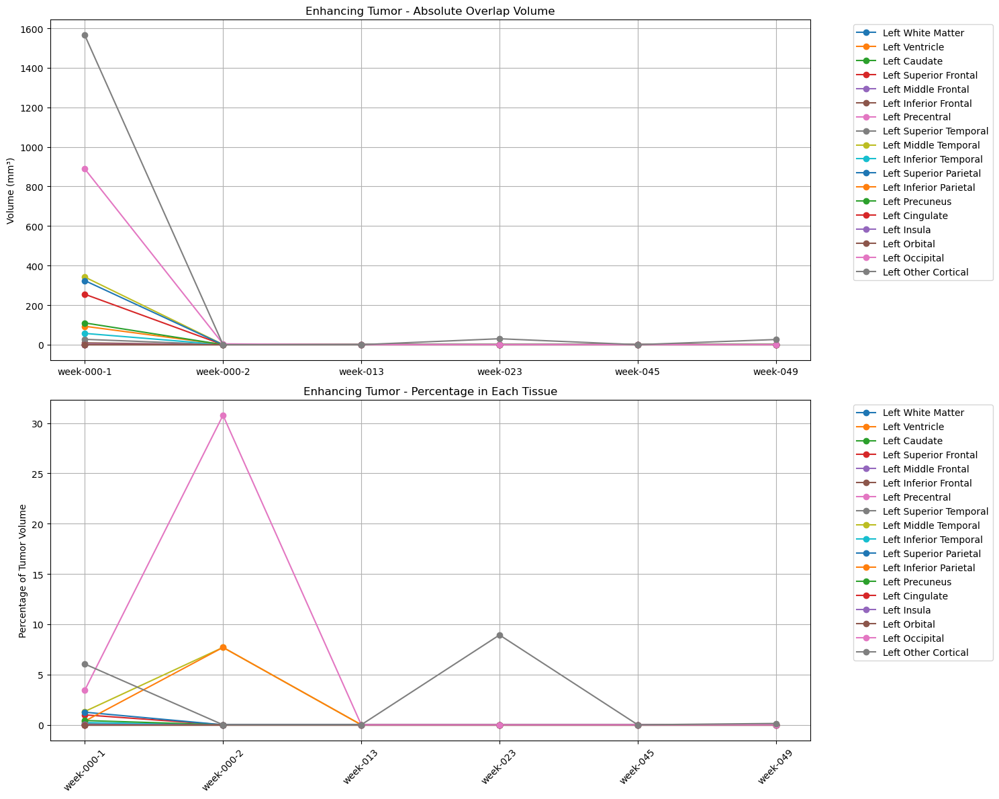

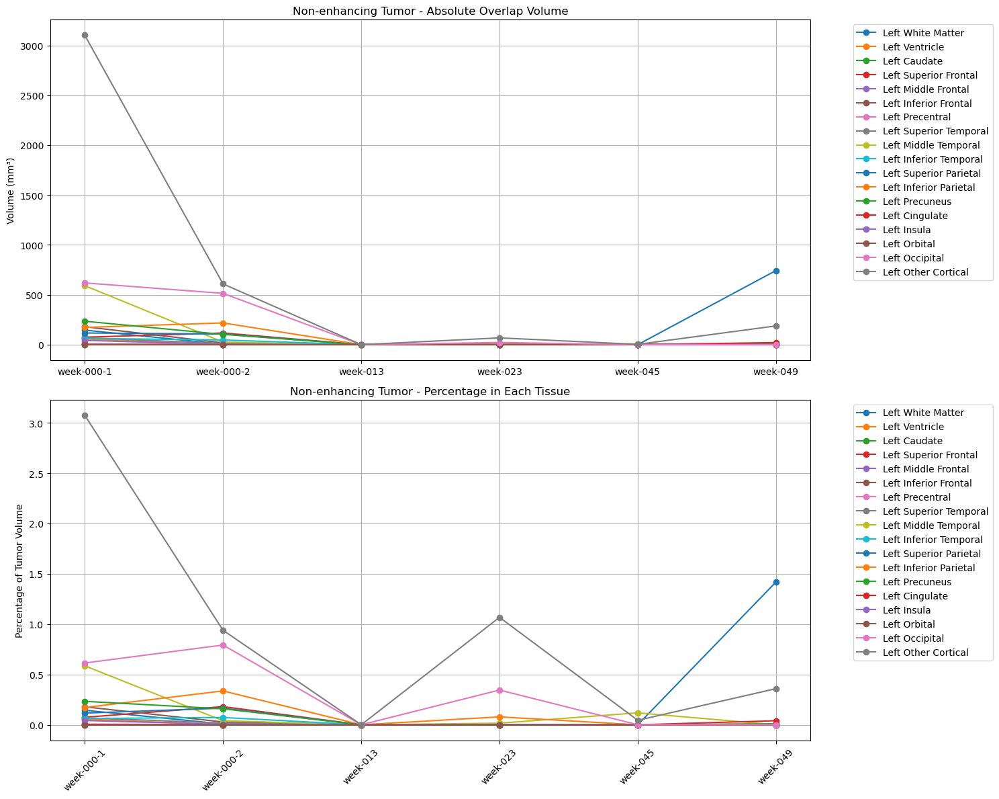


Summary of tumor distribution across left hemisphere regions:
Timepoint   Tumor_Compartment  Tissue                
week-000-1  Enhancing          Left Caudate               0.000000
                               Left Cingulate             0.000000
                               Left Inferior Frontal      0.034744
                               Left Inferior Parietal     0.359018
                               Left Inferior Temporal     0.220043
                               Left Insula                0.003860
                               Left Middle Frontal        0.000000
                               Left Middle Temporal       1.320259
                               Left Occipital             3.431902
                               Left Orbital               0.000000
                               Left Other Cortical        6.041538
                               Left Precentral            0.003860
                               Left Precuneus             0.424645
            

In [20]:
def analyze_detailed_tumor_tissue_overlap(base_dir, timepoint):
    """
    Analyze overlap between tumor compartments and all left hemisphere regions from SynthSeg
    """
    import nibabel as nib
    import pandas as pd
    
    # Define comprehensive left hemisphere tissue classes
    left_tissue_classes = {
        # Subcortical structures
        'Left White Matter': [2],      # Left Cerebral White Matter
        'Left Ventricle': [4],         # Left Lateral Ventricle
        'Left Caudate': [11],          # Left Caudate
        
        # Cortical regions (1xxx series)
        'Left Superior Frontal': [1012],
        'Left Middle Frontal': [1003],
        'Left Inferior Frontal': [1017],
        'Left Precentral': [1024],
        'Left Superior Temporal': [1030],
        'Left Middle Temporal': [1015],
        'Left Inferior Temporal': [1009],
        'Left Superior Parietal': [1029],
        'Left Inferior Parietal': [1008],
        'Left Precuneus': [1025],
        'Left Cingulate': [1002],
        'Left Insula': [1035],
        'Left Orbital': [1019, 1020],
        'Left Occipital': [1022, 1023],
        
        # Additional regions present in your data
        'Left Other Cortical': [1006, 1007, 1010, 1011, 1013, 1016, 1018, 1021, 
                               1026, 1027, 1028, 1031, 1032, 1033]
    }
    
    # Load images
    seg_path = f"{base_dir}/registered_timepoints/{timepoint}_segmentation_registered.nii.gz"
    synth_path = f"{base_dir}/registered_timepoints/{timepoint}_synthseg_registered.nii.gz"
    
    try:
        seg_img = nib.load(seg_path)
        synth_img = nib.load(synth_path)
        
        if seg_img.shape != synth_img.shape:
            print(f"\nWarning: Image shape mismatch!")
            print(f"Segmentation: {seg_img.shape}")
            print(f"SynthSeg: {synth_img.shape}")
            return None
            
    except FileNotFoundError as e:
        print(f"Error: {e}")
        return None
    
    # Get voxel dimensions for volume calculation
    voxel_volume = np.prod(seg_img.header.get_zooms())  # mm³
    
    # Get data
    tumor_data = seg_img.get_fdata()
    tissue_labels = synth_img.get_fdata()
    
    # Define tumor compartments
    tumor_compartments = {
        'Enhancing': tumor_data == 2,
        'Non-enhancing': tumor_data == 1
    }
    
    # Initialize results
    results = []
    
    # Calculate overlaps
    for comp_name, comp_mask in tumor_compartments.items():
        comp_volume = np.sum(comp_mask) * voxel_volume
        
        for tissue_name, labels in left_tissue_classes.items():
            tissue_mask = np.isin(tissue_labels, labels)
            overlap = np.logical_and(comp_mask, tissue_mask)
            
            tissue_volume = np.sum(tissue_mask) * voxel_volume
            overlap_volume = np.sum(overlap) * voxel_volume
            
            percent_of_tumor = (overlap_volume / comp_volume) * 100 if comp_volume > 0 else 0
            percent_of_tissue = (overlap_volume / tissue_volume) * 100 if tissue_volume > 0 else 0
            
            results.append({
                'Timepoint': timepoint,
                'Tumor_Compartment': comp_name,
                'Tissue': tissue_name,
                'Overlap_Volume_mm3': overlap_volume,
                'Tumor_Volume_mm3': comp_volume,
                'Tissue_Volume_mm3': tissue_volume,
                'Percent_of_Tumor': percent_of_tumor,
                'Percent_of_Tissue': percent_of_tissue
            })
    
    return pd.DataFrame(results)

def plot_detailed_overlap_evolution(combined_results):
    """Enhanced visualization of tumor-tissue overlap evolution"""
    import matplotlib.pyplot as plt
    import seaborn as sns
    
    # Create separate plots for each tumor compartment
    for comp in ['Enhancing', 'Non-enhancing']:
        comp_data = combined_results[combined_results['Tumor_Compartment'] == comp]
        
        # Create figure with two subplots
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))
        
        # Plot absolute volumes
        for tissue in comp_data['Tissue'].unique():
            tissue_data = comp_data[comp_data['Tissue'] == tissue]
            ax1.plot(tissue_data['Timepoint'], tissue_data['Overlap_Volume_mm3'], 
                    marker='o', label=tissue)
        
        ax1.set_title(f'{comp} Tumor - Absolute Overlap Volume')
        ax1.set_ylabel('Volume (mm³)')
        ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        ax1.grid(True)
        plt.xticks(rotation=45)
        
        # Plot percentages
        for tissue in comp_data['Tissue'].unique():
            tissue_data = comp_data[comp_data['Tissue'] == tissue]
            ax2.plot(tissue_data['Timepoint'], tissue_data['Percent_of_Tumor'], 
                    marker='o', label=tissue)
        
        ax2.set_title(f'{comp} Tumor - Percentage in Each Tissue')
        ax2.set_ylabel('Percentage of Tumor Volume')
        ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        ax2.grid(True)
        plt.xticks(rotation=45)
        
        plt.tight_layout()
        plt.show()

# Run analysis
timepoints = ['week-000-1', 'week-000-2', 'week-013', 'week-023', 'week-045', 'week-049']
base_dir = f"{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg"

all_results = []
for tp in timepoints:
    print(f"\nProcessing {tp}")
    df = analyze_detailed_tumor_tissue_overlap(base_dir, tp)
    if df is not None:
        all_results.append(df)

if all_results:
    combined_results = pd.concat(all_results, ignore_index=True)
    plot_detailed_overlap_evolution(combined_results)
    
    # Print summary statistics
    print("\nSummary of tumor distribution across left hemisphere regions:")
    summary = combined_results.groupby(['Timepoint', 'Tumor_Compartment', 'Tissue'])['Percent_of_Tumor'].mean()
    print(summary.to_string())
else:
    print("No results to analyze")

### Visualization of coregistered synthseg

In [21]:
def inspect_synthseg_values(base_dir, timepoints, slice_idx=185):
    """
    Inspect unique values in synthseg masks across timepoints.
    Print values and their frequencies in the specified slice.
    """
    import nibabel as nib
    from pathlib import Path
    import numpy as np
    
    reg_dir = Path(base_dir) / 'registered_timepoints'
    all_values = set()
    
    # Check each timepoint
    for tp in timepoints:
        synthseg_path = reg_dir / f'{tp}_synthseg_registered.nii.gz'
        try:
            print(f"\nTimepoint {tp}:")
            
            # Load and convert to integers
            synthseg = nib.load(str(synthseg_path))
            seg_data = np.round(synthseg.get_fdata()).astype(int)
            
            # Get slice
            seg_slice = seg_data[:, :, slice_idx]
            
            # Get unique values and their counts in this slice
            unique, counts = np.unique(seg_slice, return_counts=True)
            value_counts = dict(zip(unique, counts))
            
            print("Label values and voxel counts in slice:")
            for val, count in value_counts.items():
                print(f"  Label {val:3d}: {count:6d} voxels")
            
            all_values.update(unique)
            
        except FileNotFoundError:
            print(f"Warning: File not found: {synthseg_path}")
    
    print("\nAll unique label values across timepoints:", sorted(all_values))
    return sorted(all_values)

# Run the diagnostic
unique_values = inspect_synthseg_values(base_dir, timepoints)


Timepoint week-000-1:
Label values and voxel counts in slice:
  Label   0:  28032 voxels
  Label   2:   2420 voxels
  Label  24:   1410 voxels
  Label  41:   3706 voxels
  Label  43:     23 voxels
  Label  50:     79 voxels
  Label 1002:     92 voxels
  Label 1003:    154 voxels
  Label 1006:     38 voxels
  Label 1007:    102 voxels
  Label 1008:     20 voxels
  Label 1009:     20 voxels
  Label 1010:      6 voxels
  Label 1011:     80 voxels
  Label 1012:     52 voxels
  Label 1013:     87 voxels
  Label 1015:     78 voxels
  Label 1016:      1 voxels
  Label 1017:     46 voxels
  Label 1018:    107 voxels
  Label 1021:      1 voxels
  Label 1022:    208 voxels
  Label 1023:    290 voxels
  Label 1024:    218 voxels
  Label 1025:    217 voxels
  Label 1026:     47 voxels
  Label 1027:    420 voxels
  Label 1028:    262 voxels
  Label 1029:    421 voxels
  Label 1031:    148 voxels
  Label 1032:     19 voxels
  Label 1033:     12 voxels
  Label 2002:     50 voxels
  Label 2008:    25

First, let's create a diagnostic function to check the FreeSurfer LUT coverage

In [22]:
def check_lut_coverage(seg_data, lut):
    """
    Check if all segmentation values have corresponding colors in the LUT.
    """
    unique_vals = np.unique(seg_data)
    missing_vals = [val for val in unique_vals if val not in lut]
    if missing_vals:
        print(f"Warning: Missing LUT colors for values: {missing_vals}")
    return missing_vals

Let's create a function to load the complete FreeSurfer LUT:

In [23]:
def load_freesurfer_lut(lut_path=None):
    """
    Load the complete FreeSurfer color LUT.
    If lut_path is None, uses the built-in default colors.
    """
    from pathlib import Path
    
    if lut_path and Path(lut_path).exists():
        # Read from FreeSurferColorLUT.txt
        lut = {}
        with open(lut_path, 'r') as f:
            for line in f:
                if line.startswith('#') or not line.strip():
                    continue
                parts = line.strip().split()
                if len(parts) >= 5:
                    idx = int(parts[0])
                    r, g, b = map(int, parts[2:5])
                    lut[idx] = f'#{r:02x}{g:02x}{b:02x}'
        return lut
    else:
        # Built-in comprehensive FreeSurfer LUT
        lut = {
            0: '#000000',    # Unknown
            1: '#FF0000',    # Left-Cerebral-Exterior
            2: '#A0A0A0',    # Left-Cerebral-White-Matter
            3: '#A0A0A0',    # Left-Cerebral-Cortex
            4: '#A0A0A0',    # Left-Lateral-Ventricle
            5: '#A0A0A0',    # Left-Inf-Lat-Vent
            6: '#A0A0A0',    # Left-Cerebellum-Exterior
            7: '#0000FF',    # Left-Cerebellum-White-Matter
            8: '#A0A0A0',    # Left-Cerebellum-Cortex
            9: '#A0A0A0',    # Left-Thalamus
            10: '#00FF00',   # Left-Thalamus-Proper
            11: '#A0A0A0',   # Left-Caudate
            12: '#FF0080',   # Left-Putamen
            13: '#A0A0A0',   # Left-Pallidum
            14: '#FF45FF',   # 3rd-Ventricle
            15: '#A0A0A0',   # 4th-Ventricle
            16: '#CCCCCC',   # Brain-Stem
            17: '#A0A0A0',   # Left-Hippocampus
            18: '#FF0000',   # Left-Amygdala
            19: '#A0A0A0',   # Left-Insula
            20: '#A0A0A0',   # Left-Operculum
            21: '#A0A0A0',   # Line-1
            22: '#A0A0A0',   # Line-2
            23: '#A0A0A0',   # Line-3
            24: '#FFFF00',   # CSF
            25: '#A0A0A0',   # Left-Lesion
            26: '#FF8C00',   # Left-Accumbens-area
            27: '#A0A0A0',   # Left-Substancia-Nigra
            28: '#00FFB4',   # Left-VentralDC
            29: '#A0A0A0',   # Left-undetermined
            30: '#00FFFF',   # Left-vessel
            31: '#A0A0A0',   # Left-choroid-plexus
            32: '#A0A0A0',   # Left-F3orb
            33: '#A0A0A0',   # Left-lOg
            34: '#A0A0A0',   # Left-aOg
            35: '#A0A0A0',   # Left-mOg
            36: '#A0A0A0',   # Left-pOg
            37: '#A0A0A0',   # Left-Stellate
            38: '#A0A0A0',   # Left-Porg
            39: '#A0A0A0',   # Left-Aorg
            # ... continuing with right hemisphere and additional structures
            40: '#A0A0A0',   # Right-Cerebral-Exterior
            41: '#A0A0A0',   # Right-Cerebral-White-Matter
            42: '#FF4F4F',   # Right-Cerebral-Cortex
            43: '#A0A0A0',   # Right-Lateral-Ventricle
            # ... (continuing with more structures)
            # Adding WM parcellation values
            100: '#E6E6E6',   # Left-WM-hypointensities
            101: '#E6E6E6',   # Right-WM-hypointensities
            102: '#E6E6E6',   # Left-non-WM-hypointensities
            103: '#E6E6E6',   # Right-non-WM-hypointensities
            104: '#E6E6E6',   # Left-F1
            105: '#E6E6E6',   # Right-F1
            # ... (continuing with more WM regions)
            # Adding subcortical structure values
            200: '#FF8C00',   # Corpus_Callosum
            201: '#FF8C00',   # CC_Posterior
            202: '#FF8C00',   # CC_Mid_Posterior
            203: '#FF8C00',   # CC_Central
            204: '#FF8C00',   # CC_Mid_Anterior
            205: '#FF8C00',   # CC_Anterior
            # ... (continuing with more structures)
            # Adding more specialized regions
            2000: '#FF69B4',  # Right-Putamen-Expansion
            2001: '#FF69B4',  # Left-Putamen-Expansion
            2002: '#FF69B4',  # Right-Caudate-Expansion
            2003: '#FF69B4',  # Left-Caudate-Expansion
            2004: '#FF69B4',  # Right-Accumbens-Expansion
            2005: '#FF69B4',  # Left-Accumbens-Expansion
            # ... up to 2035
        }
        
        # Add remaining values up to 2035 with a default color
        for i in range(max(lut.keys()) + 1, 2036):
            if i not in lut:
                lut[i] = '#A0A0A0'  # Default gray for undefined regions
                
        return lut

In [24]:
lut_path = f"{home}/GitHub/glioma-growth/assets/FreeSurferColorLUT.txt"

lut = load_freesurfer_lut(lut_path)
# lut.keys()
# dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, ..., 14174, 14175])

In [25]:
def print_regions_in_slice(base_dir, timepoints, slice_idx=185):
    """Print all FreeSurfer regions present in the specified slice."""
    import nibabel as nib
    from pathlib import Path
    import numpy as np
    
    reg_dir = Path(base_dir) / 'registered_timepoints'
    all_labels = set()
    label_counts = {}
    
    for tp in timepoints:
        synthseg_path = reg_dir / f'{tp}_synthseg_registered.nii.gz'
        try:
            synthseg = nib.load(str(synthseg_path))
            seg_data = np.round(synthseg.get_fdata()).astype(int)
            seg_slice = seg_data[:, :, slice_idx]
            
            # Count occurrences
            unique, counts = np.unique(seg_slice, return_counts=True)
            for label, count in zip(unique, counts):
                label_counts[label] = label_counts.get(label, 0) + count
            
            all_labels.update(unique)
        except FileNotFoundError:
            continue
    
    # Sort by frequency
    sorted_labels = sorted(label_counts.items(), key=lambda x: x[1], reverse=True)
    print("\nMost frequent labels and their total voxel counts:")
    for label, count in sorted_labels[:20]:
        print(f"Label {label:3d}: {count:6d} voxels")
    
    return sorted(all_labels)

# Get and print regions in slice
present_labels = print_regions_in_slice(base_dir, timepoints, slice_idx=185)


Most frequent labels and their total voxel counts:
Label   0: 169215 voxels
Label  41:  21245 voxels
Label   2:  15527 voxels
Label  24:   9694 voxels
Label 1027:   2355 voxels
Label 1029:   2246 voxels
Label 2031:   2139 voxels
Label 2008:   1672 voxels
Label 1028:   1632 voxels
Label 2025:   1463 voxels
Label 1025:   1313 voxels
Label 1023:   1303 voxels
Label 1022:   1207 voxels
Label 2029:   1204 voxels
Label 1024:   1191 voxels
Label 2027:   1168 voxels
Label 2028:   1066 voxels
Label 1003:    998 voxels
Label  43:    961 voxels
Label 2022:    890 voxels


In [26]:
def create_longitudinal_visualization_with_synthseg(base_dir, timepoints, modalities, 
                                                  slice_idx=None, alpha=0.3,
                                                  freesurfer_lut_path=None):
    """
    Create a figure showing registered images across timepoints with synthseg overlay.
    Uses FreeSurfer LUT for coloring anatomical regions.
    """
    import matplotlib.pyplot as plt
    import nibabel as nib
    from pathlib import Path
    import numpy as np
    from matplotlib.patches import Patch
    
    # FreeSurfer label to name mapping grouped by anatomical categories
    FreeSurferLabels = {
        # Cortical Regions - Left
        1003: "Left-Middle-Frontal",
        1012: "Left-Superior-Frontal",
        1014: "Left-Superior-Temporal",
        1017: "Left-Inferior-Temporal",
        1018: "Left-Middle-Temporal",
        1019: "Left-Insula",
        1020: "Left-Cingulate-Anterior",
        1026: "Left-Cingulate-Middle",
        1027: "Left-Cingulate-Posterior",
        1028: "Left-Precuneus",
        1032: "Left-Frontal-Pole",
        
        # Cortical Regions - Right
        2003: "Right-Middle-Frontal",
        2012: "Right-Superior-Frontal",
        2014: "Right-Superior-Temporal",
        2017: "Right-Inferior-Temporal",
        2018: "Right-Middle-Temporal",
        2019: "Right-Insula",
        2020: "Right-Cingulate-Anterior",
        2026: "Right-Cingulate-Middle",
        2027: "Right-Cingulate-Posterior",
        2028: "Right-Precuneus",
        2032: "Right-Frontal-Pole",
        
        # Deep Gray Matter - Left
        10: "Left-Thalamus",
        11: "Left-Caudate",
        12: "Left-Putamen",
        13: "Left-Pallidum",
        17: "Left-Hippocampus",
        18: "Left-Amygdala",
        
        # Deep Gray Matter - Right
        49: "Right-Thalamus",
        50: "Right-Caudate",
        51: "Right-Putamen",
        52: "Right-Pallidum",
        53: "Right-Hippocampus",
        54: "Right-Amygdala",
        
        # White Matter
        2: "Left-Cerebral-WM",
        41: "Right-Cerebral-WM",
        77: "WM-hypointensities",
        
        # Ventricles and CSF
        4: "Left-Lateral-Ventricle",
        43: "Right-Lateral-Ventricle",
        14: "Third-Ventricle",
        15: "Fourth-Ventricle",
        24: "CSF",
        
        # Other Important Structures
        16: "Brain-Stem",
        28: "Left-VentralDC",
        29: "Right-VentralDC",
        85: "Optic-Chiasm"
    }
    
    # Group labels by category for legend organization
    LabelGroups = {
        "Cortical Regions - Left": [1003, 1012, 1014, 1017, 1018, 1019, 1020, 1026, 1027, 1028, 1032],
        "Cortical Regions - Right": [2003, 2012, 2014, 2017, 2018, 2019, 2020, 2026, 2027, 2028, 2032],
        "Deep Gray Matter": [10, 11, 12, 13, 17, 18, 49, 50, 51, 52, 53, 54],
        "White Matter": [2, 41, 77],
        "Ventricles & CSF": [4, 43, 14, 15, 24],
        "Other Structures": [16, 28, 29, 85]
    }

    def crop_brain_region(slice_data, seg_slice=None, padding=10):
        """Crop the brain region from the slice with padding."""
        rows = np.any(slice_data, axis=1)
        cols = np.any(slice_data, axis=0)
        rmin, rmax = np.where(rows)[0][[0, -1]]
        cmin, cmax = np.where(cols)[0][[0, -1]]
        
        rmin = max(rmin - padding, 0)
        rmax = min(rmax + padding, slice_data.shape[0])
        cmin = max(cmin - padding, 0)
        cmax = min(cmax + padding, slice_data.shape[1])
        
        cropped_slice = slice_data[rmin:rmax, cmin:cmax]
        if seg_slice is not None:
            cropped_seg = seg_slice[rmin:rmax, cmin:cmax]
            return cropped_slice, cropped_seg
        return cropped_slice
    
    def get_present_labels_by_group(base_dir, timepoints, slice_idx):
        """Get the labels present in the slice, organized by anatomical group."""
        label_counts = {group: {} for group in LabelGroups.keys()}
        reg_dir = Path(base_dir) / 'registered_timepoints'
        
        for tp in timepoints:
            synthseg_path = reg_dir / f'{tp}_synthseg_registered.nii.gz'
            try:
                synthseg = nib.load(str(synthseg_path))
                seg_data = np.round(synthseg.get_fdata()).astype(int)
                seg_slice = seg_data[:, :, slice_idx]
                
                unique, counts = np.unique(seg_slice, return_counts=True)
                for label, count in zip(unique, counts):
                    # Find which group this label belongs to
                    for group, labels in LabelGroups.items():
                        if label in labels:
                            label_counts[group][label] = \
                                label_counts[group].get(label, 0) + count
                            break
            except FileNotFoundError:
                continue
        
        # Sort labels within each group by frequency
        present_labels_by_group = {}
        for group, counts in label_counts.items():
            if counts:  # Only include groups with present labels
                sorted_labels = sorted(counts.items(), key=lambda x: x[1], reverse=True)
                present_labels_by_group[group] = [label for label, _ in sorted_labels]
        
        return present_labels_by_group
    
    # First, load the FreeSurfer LUT
    lut = load_freesurfer_lut(freesurfer_lut_path)
    print(f"Loaded FreeSurfer LUT with {len(lut)} color mappings")
    
    # Setup figure
    plt.style.use('dark_background')
    fig = plt.figure(figsize=(24, 20))
    fig.patch.set_facecolor('black')
    
    # Create subplot grid
    gs = fig.add_gridspec(len(modalities), len(timepoints), 
                         left=0.06, right=0.99, top=0.95, bottom=0.15,
                         hspace=0.1, wspace=0.05)
    axes = [[fig.add_subplot(gs[i, j]) for j in range(len(timepoints))] 
            for i in range(len(modalities))]
    
    time_labels = ['0 days', '3 days', '13 weeks', '23 weeks', '45 weeks', '49 weeks']
    reg_dir = Path(base_dir) / 'registered_timepoints'
    
    # Load and display images
    for i, mod in enumerate(modalities):
        for j, tp in enumerate(timepoints):
            mod_name = mod.replace('.nii.gz', '')
            img_path = reg_dir / f'{tp}_{mod_name}_registered.nii.gz'
            synthseg_path = reg_dir / f'{tp}_synthseg_registered.nii.gz'
            
            try:
                # Load modality image
                img = nib.load(str(img_path))
                data = img.get_fdata()
                
                # Load synthseg and ensure integer values
                synthseg = nib.load(str(synthseg_path))
                seg_data = np.round(synthseg.get_fdata()).astype(int)
                
                # Get slice
                if slice_idx is None:
                    slice_idx = data.shape[2] // 2
                
                slice_data = data[:, :, slice_idx]
                seg_slice = seg_data[:, :, slice_idx]
                
                # Apply orientation
                slice_data = np.rot90(slice_data, k=+1)
                slice_data = np.fliplr(slice_data)
                seg_slice = np.rot90(seg_slice, k=+1)
                seg_slice = np.fliplr(seg_slice)
                
                # Crop brain region
                slice_data, seg_slice = crop_brain_region(slice_data, seg_slice, padding=20)
                
                # Display base image
                axes[i][j].imshow(slice_data, cmap='gray')
                
                # Create overlay for each anatomical structure
                unique_slice_vals = np.unique(seg_slice)
                for val in unique_slice_vals:
                    if val in FreeSurferLabels:  # Only show defined regions
                        mask = (seg_slice == val)
                        if np.any(mask):
                            axes[i][j].imshow(mask, 
                                            cmap=plt.cm.colors.ListedColormap([lut[val]]),
                                            alpha=alpha * mask)
                
                axes[i][j].axis('off')
                axes[i][j].set_facecolor('black')
                
                # Add labels
                if j == 0:
                    row_positions = {
                        'CT1': 0.85,
                        'T1': 0.65,
                        'T2': 0.45,
                        'FLAIR': 0.25
                    }
                    fig.text(0.045, row_positions[mod_name], mod_name, 
                            fontsize=16, fontweight='bold', 
                            ha='right', va='center',
                            color='white')
                if i == 0:
                    axes[i][j].set_title(time_labels[j], fontsize=18, color='white')
                    
            except FileNotFoundError as e:
                print(f"Warning: File not found: {e.filename}")
                axes[i][j].text(0.5, 0.5, 'Missing', ha='center', va='center',
                              color='white')
                axes[i][j].axis('off')
    
    # Get labels present in slice, organized by group
    present_labels_by_group = get_present_labels_by_group(base_dir, timepoints, slice_idx)
    
    # Create legend elements grouped by category
    legend_elements = []
    for group, labels in present_labels_by_group.items():
        # Add group header
        legend_elements.append(Patch(facecolor='none', edgecolor='none', 
                                   label=f'\n{group}:'))
        # Add regions in this group
        for label in labels:
            legend_elements.append(
                Patch(facecolor=lut[label], alpha=alpha,
                      label=f'{FreeSurferLabels[label]} ({label})')
            )
    
    # Add grouped legend
    fig.legend(handles=legend_elements,
              loc='lower center',
              bbox_to_anchor=(0.5, 0.02),
              ncol=5,
              fontsize=10,
              frameon=False,
              columnspacing=1.0,
              handletextpad=0.5)
    
    # Save figure
    output_path = reg_dir / 'longitudinal_registration_visualization_with_synthseg_alpha_05.png'
    #plt.savefig(output_path, dpi=300, bbox_inches='tight', facecolor='black', edgecolor='none')
    #print(f"Visualization saved to {output_path}")
    
    plt.show()
    plt.close()

Loaded FreeSurfer LUT with 1475 color mappings


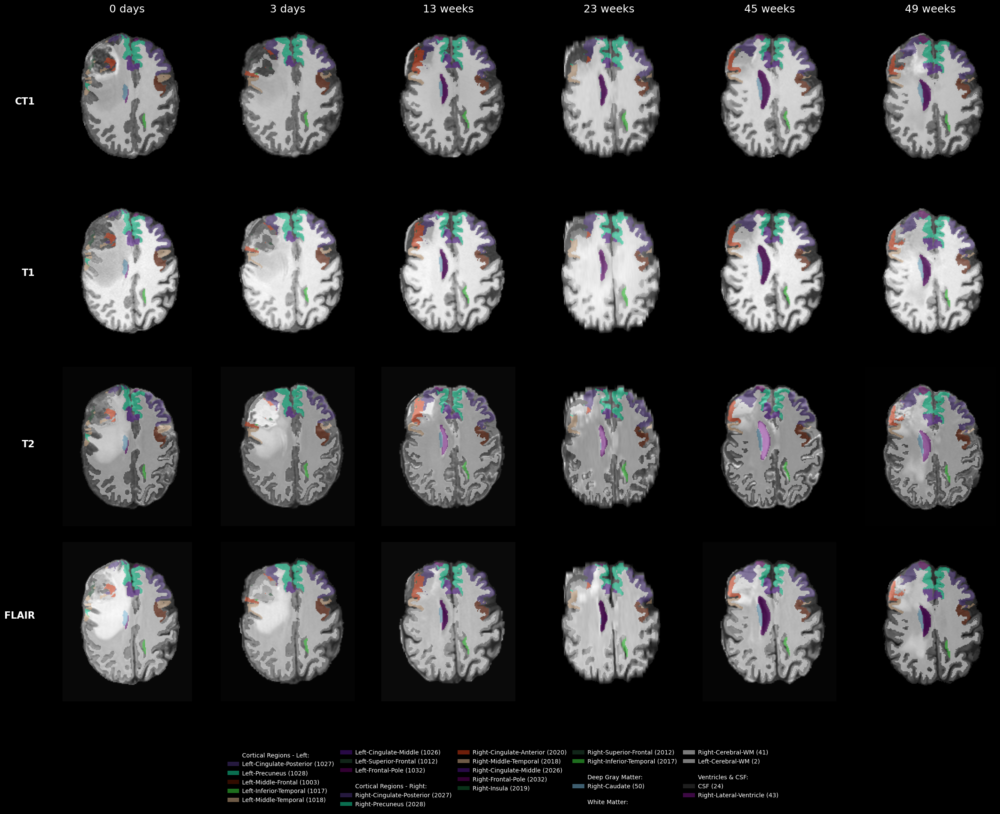

CPU times: user 18 s, sys: 4.37 s, total: 22.4 s
Wall time: 22.9 s


In [27]:
%%time
# Set up paths and parameters
lut_path = f"{home}/GitHub/glioma-growth/assets/FreeSurferColorLUT.txt"
base_dir = f"{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg"
timepoints = ['week-000-1', 'week-000-2', 'week-013', 'week-023', 'week-045', 'week-049']
modalities = ['CT1', 'T1', 'T2', 'FLAIR']

# Create visualization
all_seg_values = create_longitudinal_visualization_with_synthseg(
    base_dir=base_dir,
    timepoints=timepoints,
    modalities=modalities,
    slice_idx=185,
    alpha=0.5,
    freesurfer_lut_path=lut_path
)

_Make the same figure, but add the two tumor compartment segmentations to the overlay, on the T2 modality only_

Visualization saved to /Users/arvid/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg/registered_timepoints/longitudinal_registration_visualization_slice_185_with_synthseg_all_alpha_03_tumor_on_T2.png


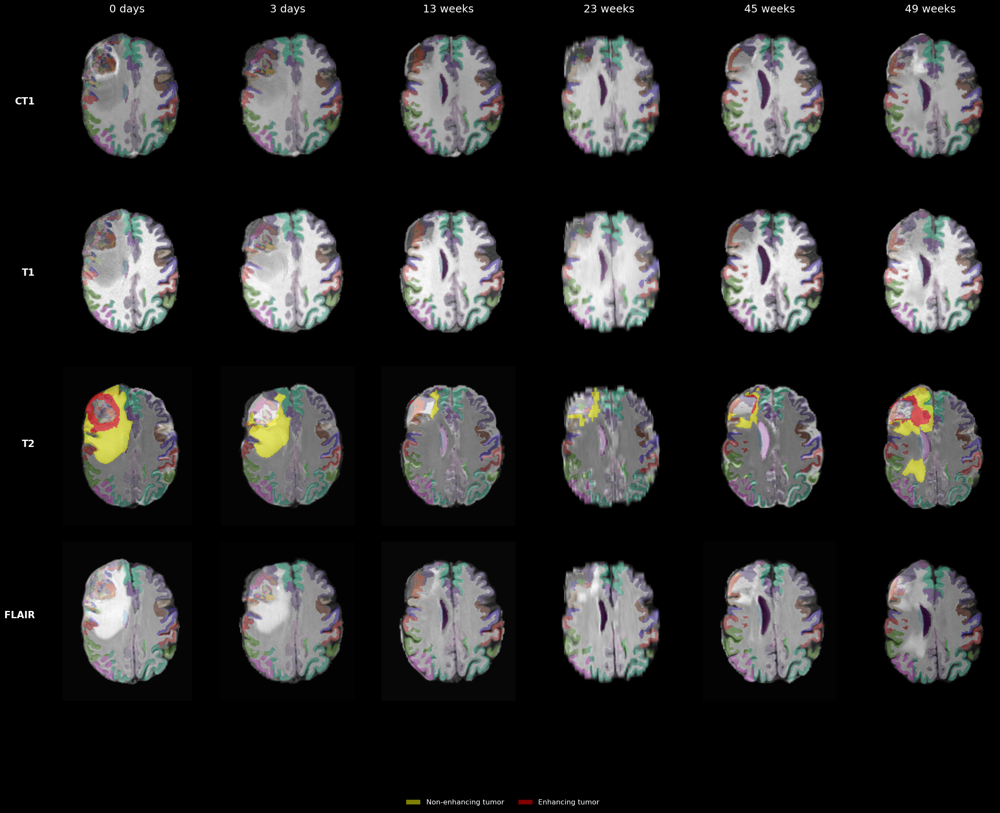

In [28]:
def create_longitudinal_visualization_with_synthseg(base_dir, timepoints, modalities, 
                                                  slice_idx=None, alpha=0.3,
                                                  freesurfer_lut_path=None):
    """
    Create visualization with synthseg overlay and tumor segmentations on T2
    """
    import matplotlib.pyplot as plt
    import nibabel as nib
    from pathlib import Path
    import numpy as np
    from matplotlib.patches import Patch
    
    def crop_brain_region(slice_data, seg_slice=None, tumor_slice=None, padding=10):
        """Crop the brain region from the slice with padding."""
        rows = np.any(slice_data, axis=1)
        cols = np.any(slice_data, axis=0)
        rmin, rmax = np.where(rows)[0][[0, -1]]
        cmin, cmax = np.where(cols)[0][[0, -1]]
        
        rmin = max(rmin - padding, 0)
        rmax = min(rmax + padding, slice_data.shape[0])
        cmin = max(cmin - padding, 0)
        cmax = min(cmax + padding, slice_data.shape[1])
        
        cropped_slice = slice_data[rmin:rmax, cmin:cmax]
        if seg_slice is not None and tumor_slice is not None:
            cropped_seg = seg_slice[rmin:rmax, cmin:cmax]
            cropped_tumor = tumor_slice[rmin:rmax, cmin:cmax]
            return cropped_slice, cropped_seg, cropped_tumor
        return cropped_slice
    
    # Setup figure
    plt.style.use('dark_background')
    fig = plt.figure(figsize=(24, 20))
    fig.patch.set_facecolor('black')
    
    # Create subplot grid
    gs = fig.add_gridspec(len(modalities), len(timepoints), 
                         left=0.06, right=0.99, top=0.95, bottom=0.15,
                         hspace=0.1, wspace=0.05)
    axes = [[fig.add_subplot(gs[i, j]) for j in range(len(timepoints))] 
            for i in range(len(modalities))]
    
    time_labels = ['0 days', '3 days', '13 weeks', '23 weeks', '45 weeks', '49 weeks']
    reg_dir = Path(base_dir) / 'registered_timepoints'
    
    # Load FreeSurfer LUT
    lut = load_freesurfer_lut(freesurfer_lut_path)
    
    # Load and display images
    for i, mod in enumerate(modalities):
        for j, tp in enumerate(timepoints):
            mod_name = mod.replace('.nii.gz', '')
            img_path = reg_dir / f'{tp}_{mod_name}_registered.nii.gz'
            synthseg_path = reg_dir / f'{tp}_synthseg_registered.nii.gz'
            tumor_seg_path = reg_dir / f'{tp}_segmentation_registered.nii.gz'
            
            try:
                # Load all images
                img = nib.load(str(img_path))
                synthseg = nib.load(str(synthseg_path))
                tumor_seg = nib.load(str(tumor_seg_path))
                
                # Get slice data
                if slice_idx is None:
                    slice_idx = img.shape[2] // 2
                
                slice_data = img.get_fdata()[:, :, slice_idx]
                seg_slice = np.round(synthseg.get_fdata()[:, :, slice_idx]).astype(int)
                tumor_slice = tumor_seg.get_fdata()[:, :, slice_idx]
                
                # Apply orientation
                slice_data = np.rot90(slice_data, k=+1)
                slice_data = np.fliplr(slice_data)
                seg_slice = np.rot90(seg_slice, k=+1)
                seg_slice = np.fliplr(seg_slice)
                tumor_slice = np.rot90(tumor_slice, k=+1)
                tumor_slice = np.fliplr(tumor_slice)
                
                # Crop brain region
                slice_data, seg_slice, tumor_slice = crop_brain_region(
                    slice_data, seg_slice, tumor_slice, padding=20)
                
                # Display base image
                axes[i][j].imshow(slice_data, cmap='gray')
                
                # Add synthseg overlay
                unique_slice_vals = np.unique(seg_slice)
                for val in unique_slice_vals:
                    if val in lut:
                        mask = (seg_slice == val)
                        if np.any(mask):
                            axes[i][j].imshow(mask, 
                                            cmap=plt.cm.colors.ListedColormap([lut[val]]),
                                            alpha=alpha * mask)
                
                # Add tumor segmentation overlay for T2 modality only
                if mod_name == 'T2':
                    # Create tumor overlay with transparency
                    tumor_overlay = np.zeros((*tumor_slice.shape, 4))  # RGBA
                    
                    # Add non-enhancing tumor (value 1) in yellow with transparency
                    non_enh_mask = (tumor_slice == 1)
                    tumor_overlay[non_enh_mask] = [1, 1, 0, 0.5]  # Yellow with 0.5 alpha
                    
                    # Add enhancing tumor (value 2) in red with transparency
                    enh_mask = (tumor_slice == 2)
                    tumor_overlay[enh_mask] = [1, 0, 0, 0.5]  # Red with 0.5 alpha
                    
                    # Add tumor overlay
                    axes[i][j].imshow(tumor_overlay)
                
                axes[i][j].axis('off')
                axes[i][j].set_facecolor('black')
                
                # Add labels
                if j == 0:
                    row_positions = {
                        'CT1': 0.85,
                        'T1': 0.65,
                        'T2': 0.45,
                        'FLAIR': 0.25
                    }
                    fig.text(0.045, row_positions[mod_name], mod_name, 
                            fontsize=16, fontweight='bold', 
                            ha='right', va='center',
                            color='white')
                if i == 0:
                    axes[i][j].set_title(time_labels[j], fontsize=18, color='white')
                    
            except FileNotFoundError as e:
                print(f"Warning: File not found: {e.filename}")
                axes[i][j].text(0.5, 0.5, 'Missing', ha='center', va='center',
                              color='white')
                axes[i][j].axis('off')
    
    # Add legend for both SynthSeg and tumor segmentation
    legend_elements = [
        Patch(facecolor='yellow', alpha=0.5, label='Non-enhancing tumor'),
        Patch(facecolor='red', alpha=0.5, label='Enhancing tumor')
    ]
    
    fig.legend(handles=legend_elements,
              loc='lower center',
              bbox_to_anchor=(0.5, 0.02),
              ncol=2,
              fontsize=12,
              frameon=False)
    

    # Save figure
    output_path = reg_dir / 'longitudinal_registration_visualization_slice_185_with_synthseg_all_alpha_03_tumor_on_T2.png'
    plt.savefig(output_path, dpi=300, bbox_inches='tight',
                facecolor='black', edgecolor='none')
    print(f"Visualization saved to {output_path}")
    
    plt.show()
    plt.close()
    

# Run the visualization
lut_path = f"{home}/GitHub/glioma-growth/assets/FreeSurferColorLUT.txt"
base_dir = f"{home}/GitHub/glioma-growth/data/LUMIERE-Patient-048-reg"
timepoints = ['week-000-1', 'week-000-2', 'week-013', 'week-023', 'week-045', 'week-049']
modalities = ['CT1', 'T1', 'T2', 'FLAIR']

create_longitudinal_visualization_with_synthseg(
    base_dir=base_dir,
    timepoints=timepoints,
    modalities=modalities,
    slice_idx=185,
    alpha=0.3,
    freesurfer_lut_path=lut_path
)